In [2]:
import SimpleITK as sitk
import glob
import os
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
from scipy.signal import savgol_filter
from feature_utils import *
import time

In [5]:
with open(os.getcwd()+'/data/df50.p','rb') as f:
    df50 = pd.read_pickle(f)

In [6]:
df50.head()


,PID,gender,age,vessel,seg,ffr,ffr_80,n_frame,OS,distal,lu,pl,luA,plA,luAt,plAt
0,F0002,1,59,1,1,0.83,0,2381,2152,91,"[4517, 4831, 4237, 4625, 4818, 5136, 4808, 479...","[2329, 2337, 3093, 3639, 4299, 4032, 2820, 309...","[5.65995771008, 6.05341060381, 5.30910799593, ...","[2.91831780092, 2.92834207847, 3.87563630668, ...","[7.87908215209, 7.30519226251, 9.25616728013, ...","[2.80303860913, 4.09491737802, 5.35421724489, ..."
1,F0003,2,73,1,2,0.91,0,3642,3097,551,"[3705, 3767, 4139, 4650, 4692, 4526, 4548, 423...","[3038, 2923, 2509, 1992, 2036, 2141, 2291, 254...","[5.21015625, 5.29734375, 5.82046875, 6.5390625...","[4.2721875, 4.11046875, 3.52828125, 2.80125, 2...","[5.7515625, 6.03984375, 6.18328125, 4.9078125,...","[3.915, 3.6590625, 3.4509375, 4.71234375, 3.93..."
2,F0004,1,61,1,2,0.72,1,4060,3463,261,"[769, 800, 754, 832, 831, 879, 857, 843, 835, ...","[7839, 7463, 6465, 6451, 7254, 7010, 7309, 676...","[1.08140625, 1.125, 1.0603125, 1.17, 1.1685937...","[11.02359375, 10.49484375, 9.09140625, 9.07171...","[4.4465625, 4.1484375, 4.07671875, 4.460625, 4...","[3.56625, 3.99515625, 4.381875, 3.6703125, 4.2..."
3,F0005,1,61,3,2,0.83,0,3970,3883,285,"[2829, 2329, 2576, 2391, 2936, 2931, 3041, 307...","[3025, 4145, 3621, 3865, 3048, 3062, 2879, 345...","[3.97828125, 3.27515625, 3.6225, 3.36234375, 4...","[4.25390625, 5.82890625, 5.09203125, 5.4351562...","[6.80484375, 6.53203125, 6.654375, 6.52640625,...","[4.47609375, 4.52671875, 4.40578125, 4.4564062..."
4,F0007,1,60,1,2,0.85,0,2813,2610,465,"[4183, 4130, 4314, 4506, 4544, 4566, 4589, 446...","[1852, 1927, 2007, 1891, 1963, 1900, 1917, 209...","[5.88234375, 5.8078125, 6.0665625, 6.3365625, ...","[2.604375, 2.70984375, 2.82234375, 2.65921875,...","[6.77671875, 6.93703125, 7.29984375, 7.3575, 7...","[3.34265625, 3.44390625, 2.88140625, 3.11625, ..."


In [7]:
def lesionvis(i, th, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    lesionindex = lesion(df50.loc[i].luA, df50.loc[i].plA,df50.loc[i].distal,df50.loc[i].OS,th,300)
    print (lesionindex)
    plt.figure(figsize=(12,5));
    plt.plot(pb)
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='lime', label='OS')
    plt.axvline(ki, color='magenta',label='distal')
    plt.axhline(th, color='red',label=th)
    
    for l in range(0,len(lesionindex)):
        start = lesionindex[l][0]
        end = lesionindex[l][1]
        plt.axvspan(start, end, facecolor='r', alpha=0.2)
        
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    if show:
        plt.show()
    else:
        return plt 

[[649, 919]]


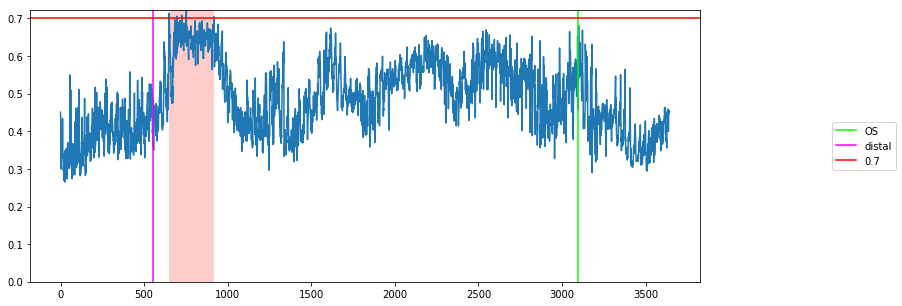

In [20]:
lesionvis(1,0.7)

## Window mean

In [11]:
t0 = time.time()
df50['luAw'] = df50['luA'].apply(lambda x: windowed_mean(x,50))
df50['plAw'] = df50['plA'].apply(lambda x: windowed_mean(x,50))
t1 = time.time()

total = t1-t0
print('Execution time: ',total,"secs")

Execution time:  0.15259289741516113 secs


In [14]:
def windowmeanvis(i, th, gap, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    # raw data
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    lesionindex = lesion(df50.loc[i].luA, df50.loc[i].plA,df50.loc[i].distal,df50.loc[i].OS,th,300)
    # smoothed data
    pb2 = plaqueburden(df50.loc[i].luAw, df50.loc[i].plAw)
    lesionindex2 = lesion(df50.loc[i].luAw, df50.loc[i].plAw,df50.loc[i].distal,df50.loc[i].OS,th,300)
    plt.figure(figsize=(12,5));
    plt.plot(pb)
    plt.plot(pb2, color='red',alpha=0.7)
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='lime', label='OS')
    plt.axvline(ki, color='magenta',label='distal')
    plt.axhline(th, color='red',label=th)
    
    for l in range(0,len(lesionindex2)):
        start = lesionindex2[l][0]
        end = lesionindex2[l][1]
        plt.axvspan(start, end, facecolor='r', alpha=0.2)
        
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    if show:
        plt.show()
    else:
        return plt

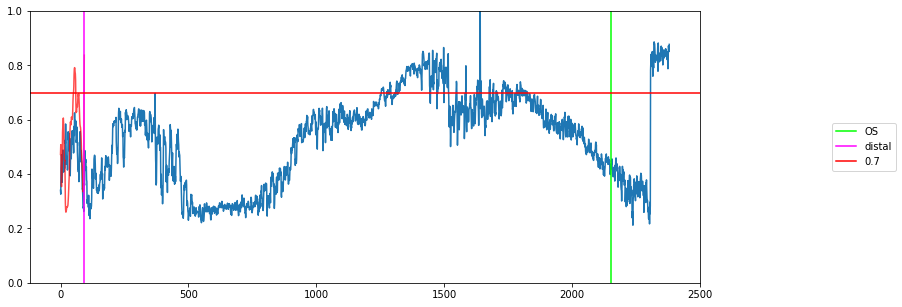

In [15]:
windowmeanvis(0,0.7,300)

## Convolve

https://stackoverflow.com/questions/13728392/moving-average-or-running-mean

http://matlabtricks.com/post-11/moving-average-by-convolution

Using convolution we can calculate the window mean with points for every value.

In [8]:
t0 = time.time()
df50['luAc'] = df50['luA'].apply(lambda x: np.convolve(x,np.ones((50,))/50,mode='same'))
df50['plAc'] = df50['plA'].apply(lambda x: np.convolve(x,np.ones((50,))/50,mode='same'))
t1 = time.time()

total = t1-t0
print('Execution time: ',total,"secs")

Execution time:  0.7010598182678223 secs


In [9]:
def convolvevis(i, th, gap, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    # raw data
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    #lesionindex = lesion(df50.loc[i].luA, df50.loc[i].plA,df50.loc[i].distal,df50.loc[i].OS,th,300)
    # smoothed data
    pb2 = plaqueburden(df50.loc[i].luAc, df50.loc[i].plAc)
    lesionindex2 = lesion(df50.loc[i].luAc, df50.loc[i].plAc,df50.loc[i].distal,df50.loc[i].OS,th,gap)
    print(lesionindex2)
    plt.figure(figsize=(12,5));
    plt.plot(pb,alpha=0.3,label='original')
    plt.plot(pb2, color='red',alpha=0.7,label='smooth 50')
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='cyan', label='OS')
    plt.axvline(ki, color='darkcyan',label='distal')
    plt.axhline(th, linestyle='--', color='red',label=th,alpha=0.5)
    
    if(lesionindex2 != -1):
        for l in range(0,len(lesionindex2)):
            start = lesionindex2[l][0]
            end = lesionindex2[l][1]
            plt.axvspan(start, end, facecolor='r', alpha=0.2)
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    if show:
        plt.show()
    else:
        return plt

0
[]


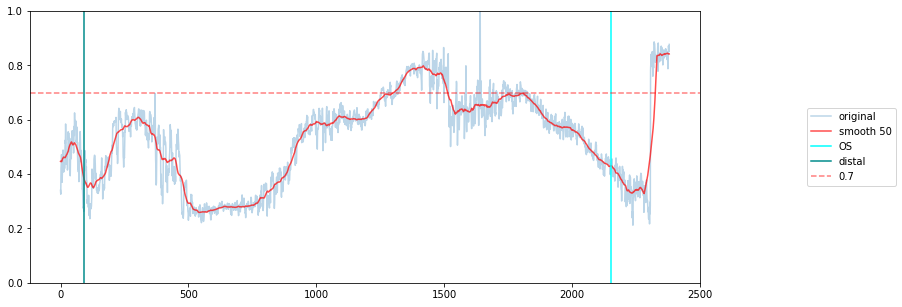

1
-1


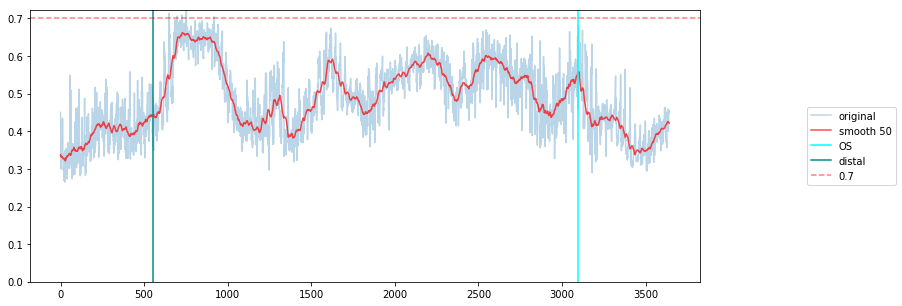

2
[array([2578, 3406])]


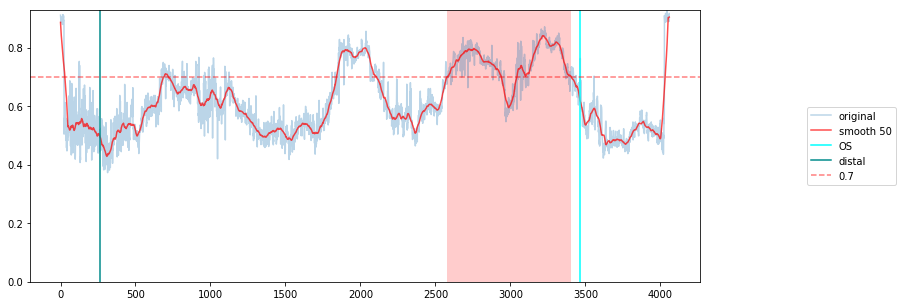

3
[array([2302, 2654])]


/Users/paulnguyen/Desktop/Regis/Practicum2/bloodpressure_ffr/feature_utils.py:99: RuntimeWarning: invalid value encountered in true_divide
  return y/(x + y)


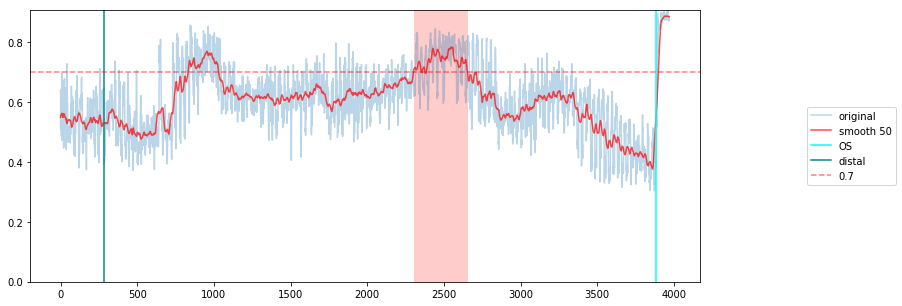

4
[]


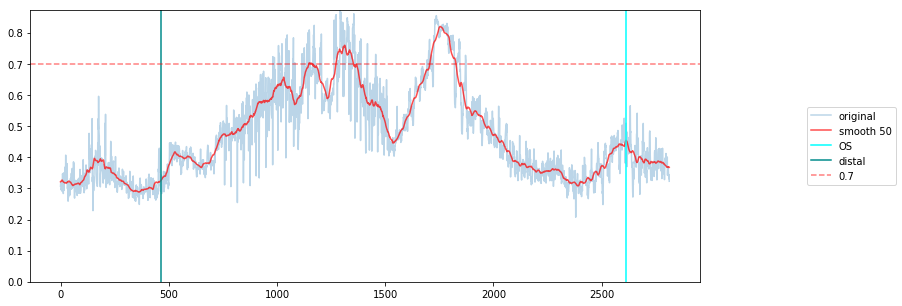

5
[]


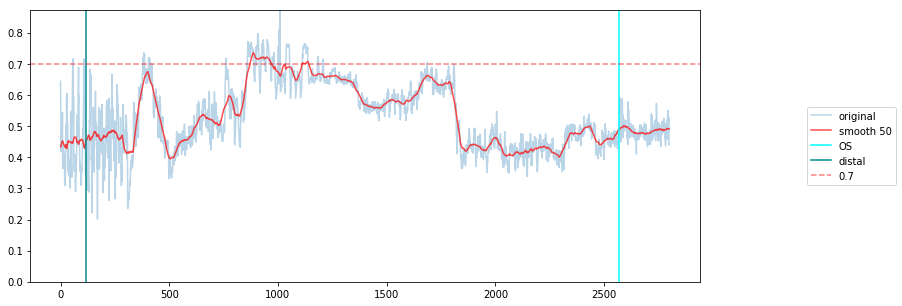

6
[]


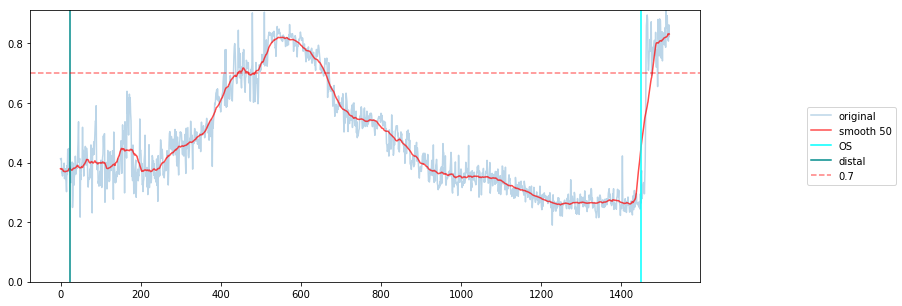

7
[array([1339, 1876])]


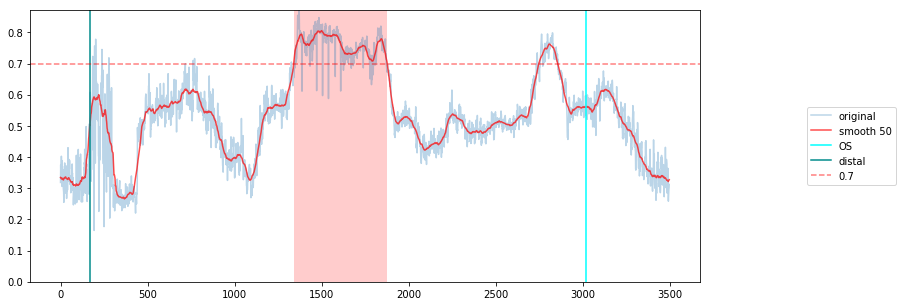

8
[]


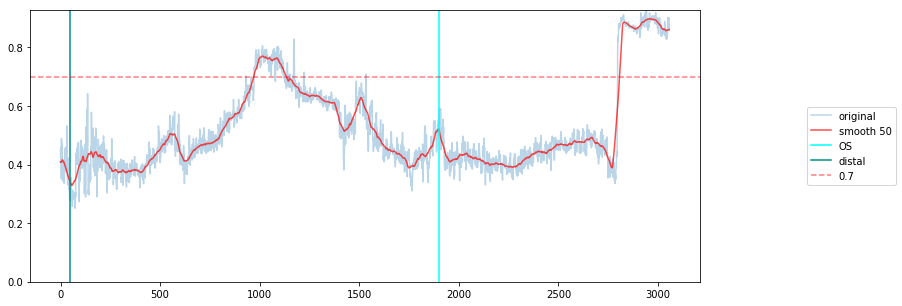

9
[]


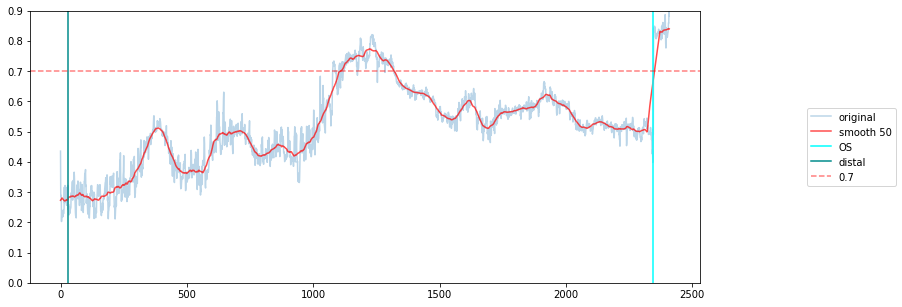

10
[]


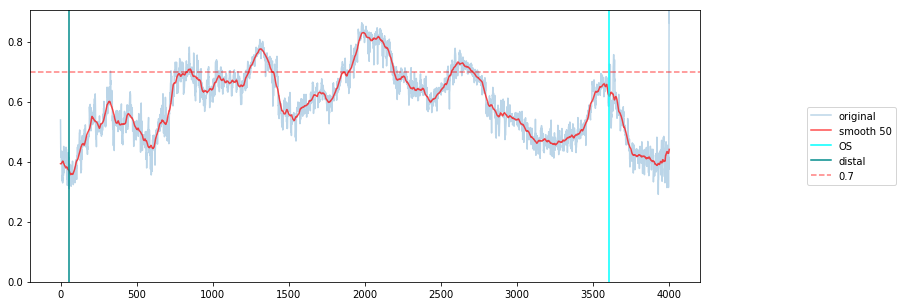

11
[array([1331, 1638]), array([2943, 3549])]


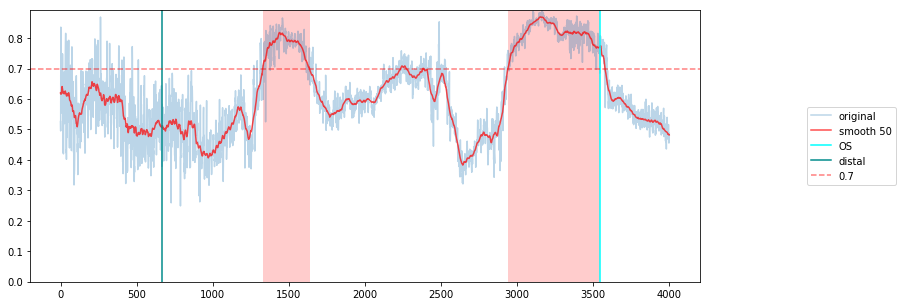

12
[]


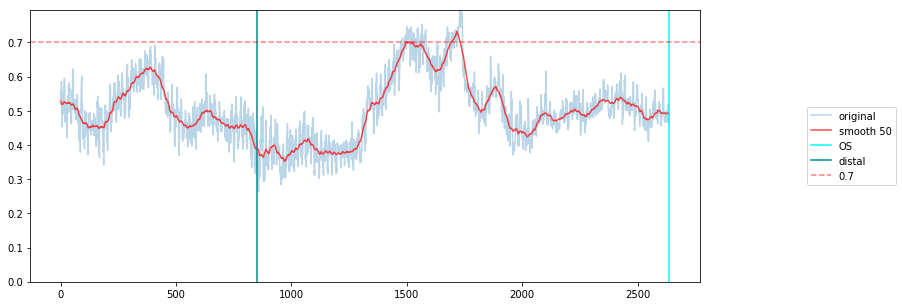

13
-1


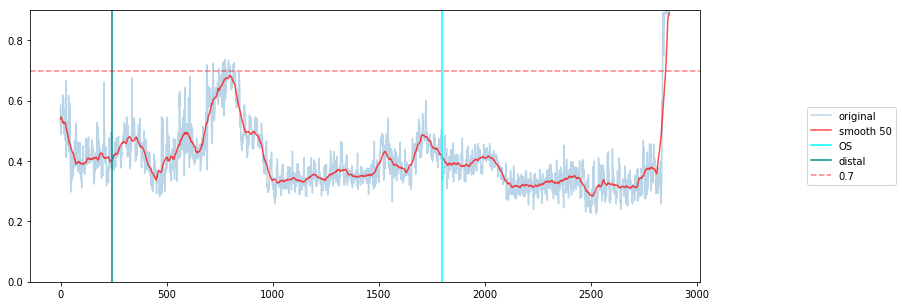

14
[array([1526, 1944])]


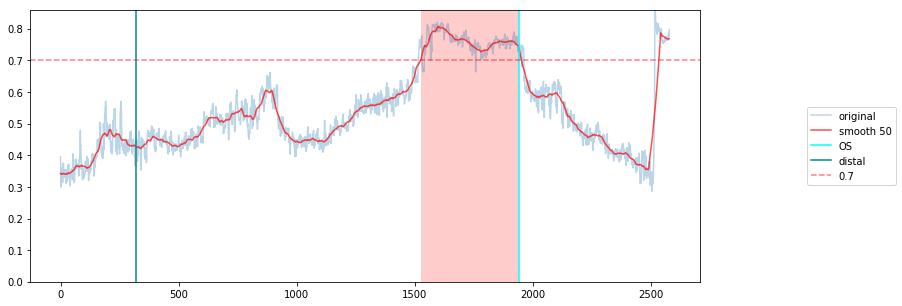

15
[]


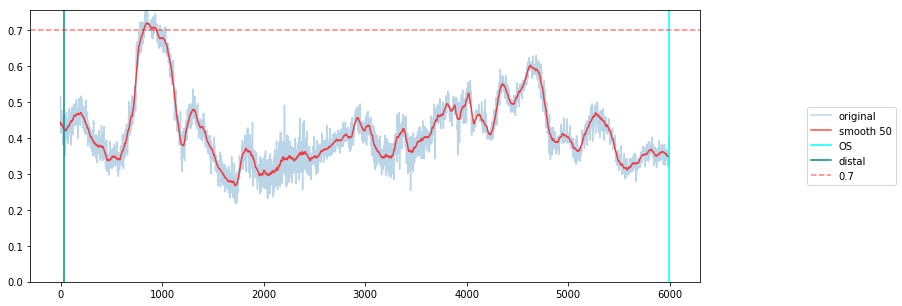

16
[array([1047, 1428])]


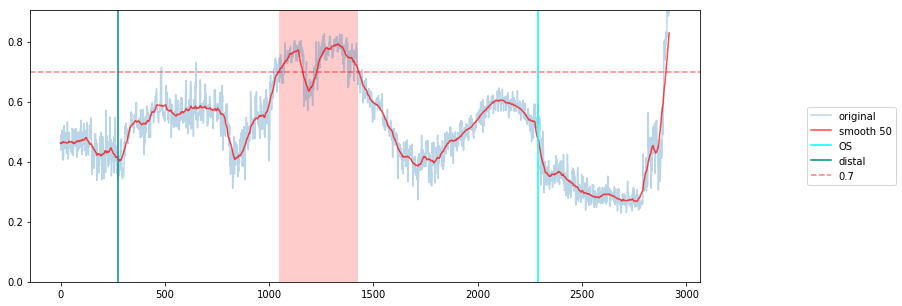

17
[array([597, 909])]


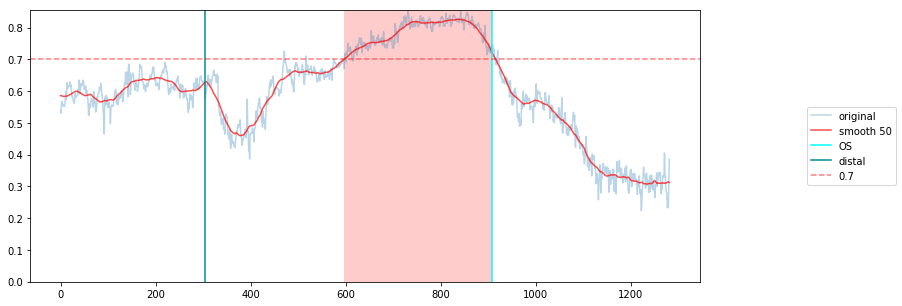

18
[array([ 459, 1108])]


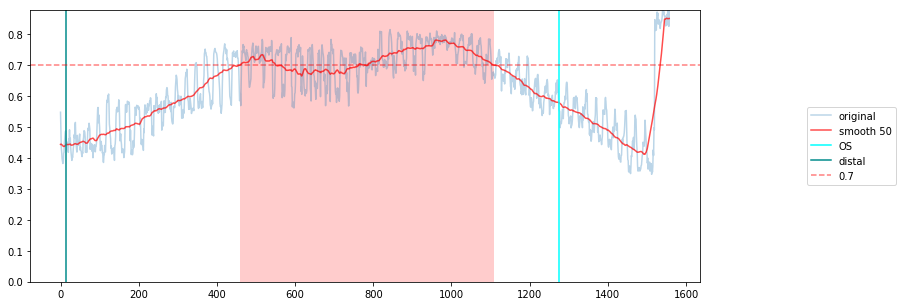

19
[array([ 495, 1363])]


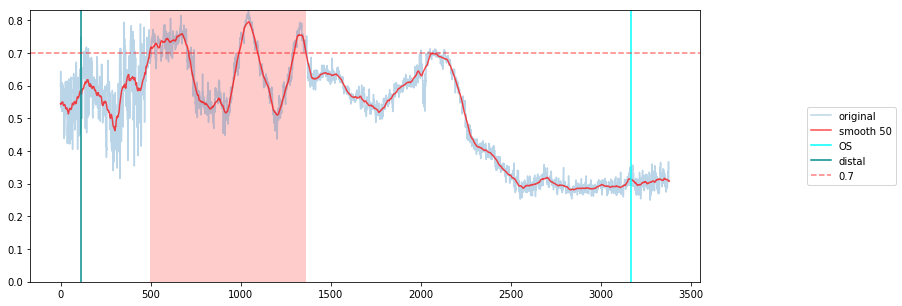

20
[array([1114, 2291])]


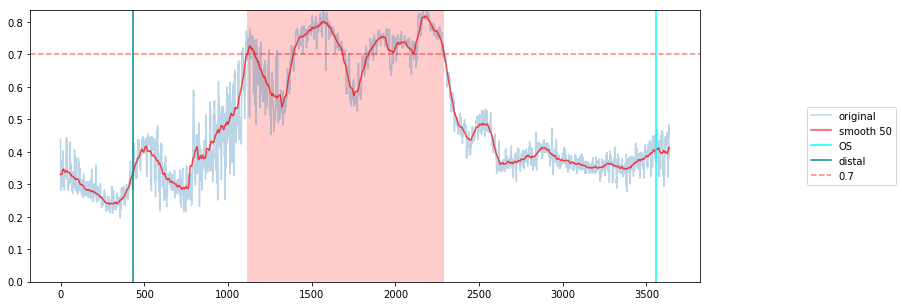

21
[array([1081, 2481])]


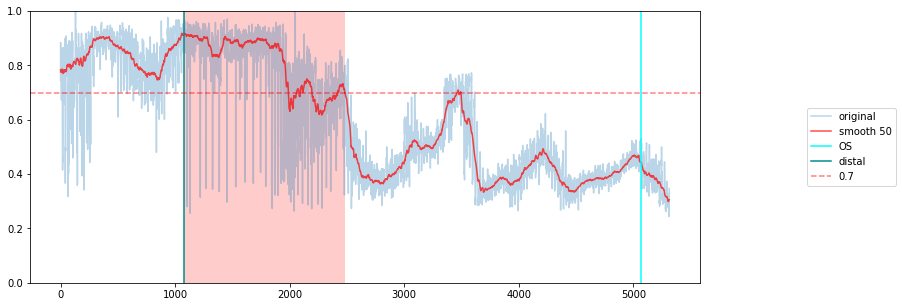

22
[]


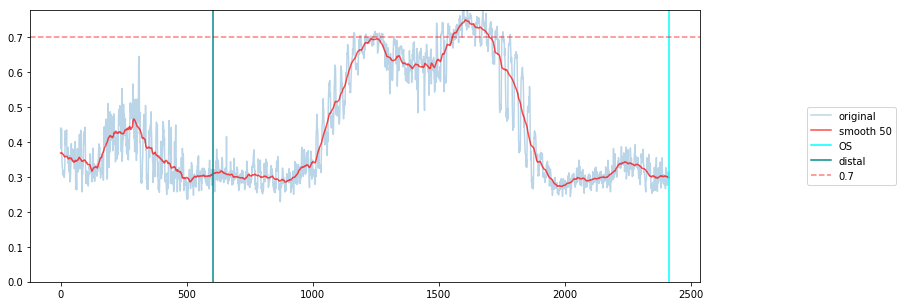

23
[array([ 758, 1622])]


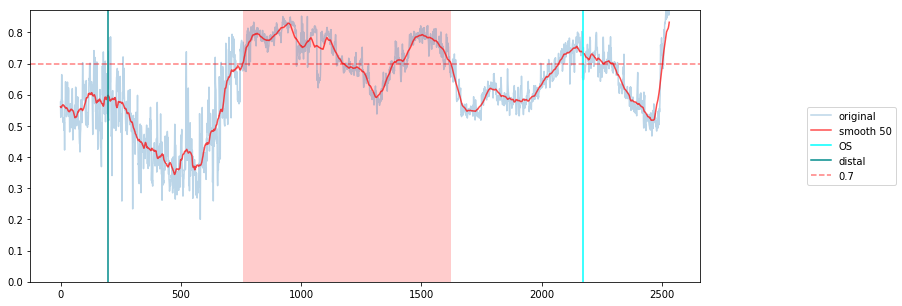

24
[array([1608, 2941])]


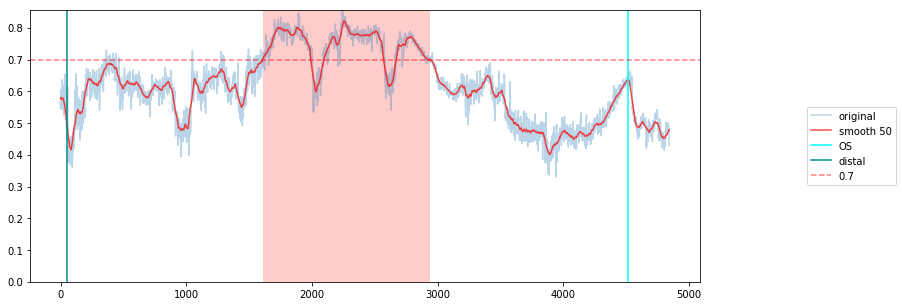

25
[]


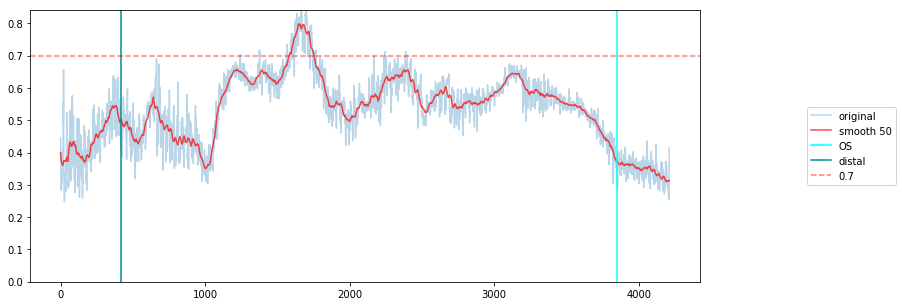

26
-1


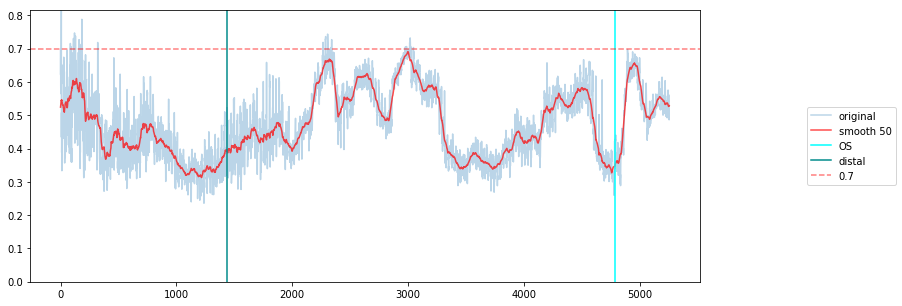

27
[array([1095, 1506])]


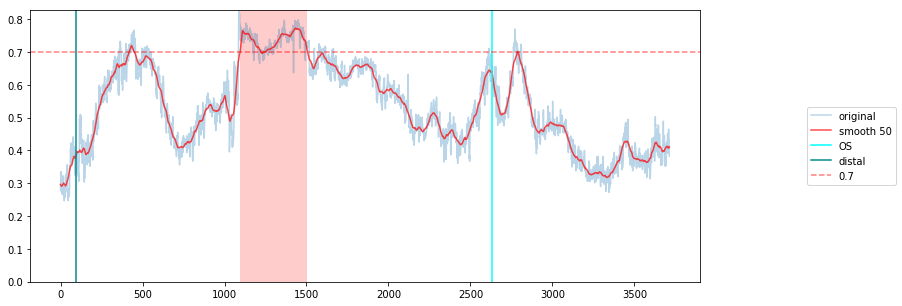

28
[]


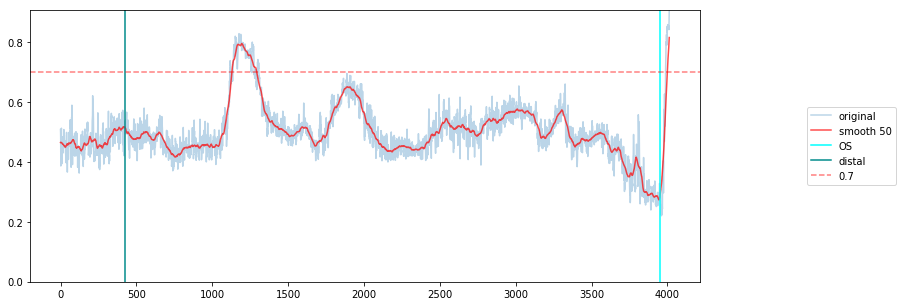

29
-1


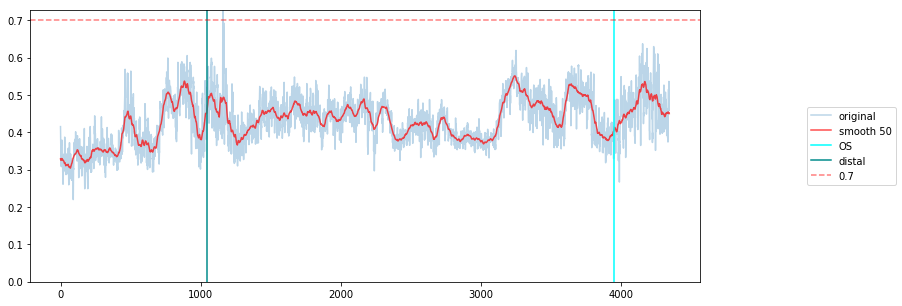

30
[array([1794, 2279])]


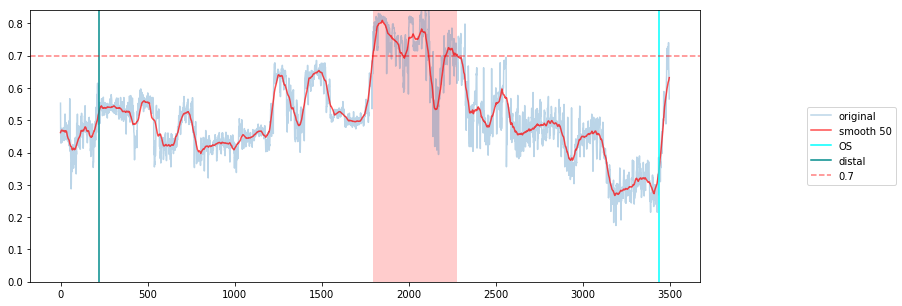

31
[array([ 758, 1615])]


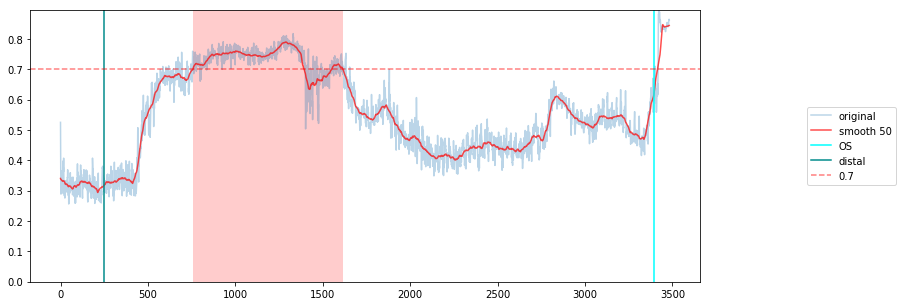

33
[array([1315, 2484])]


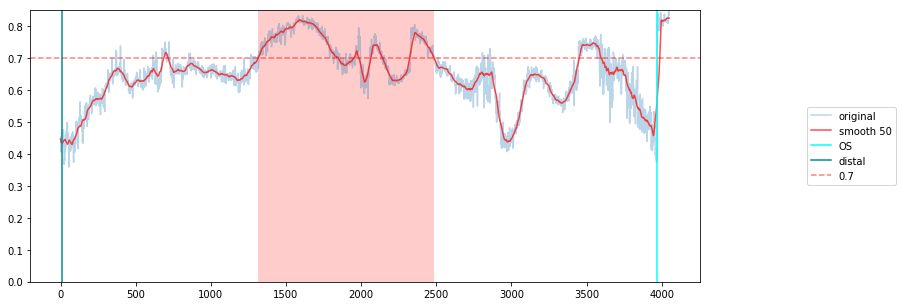

34
[]


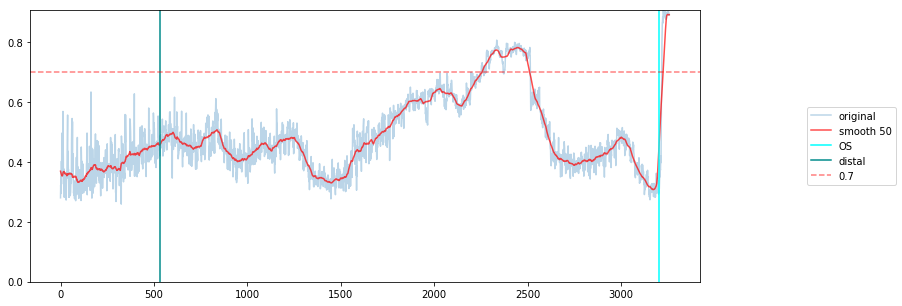

35
[]


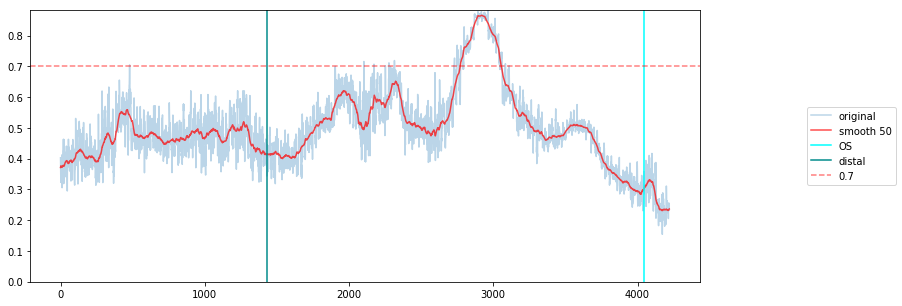

36
[array([1772, 2935])]


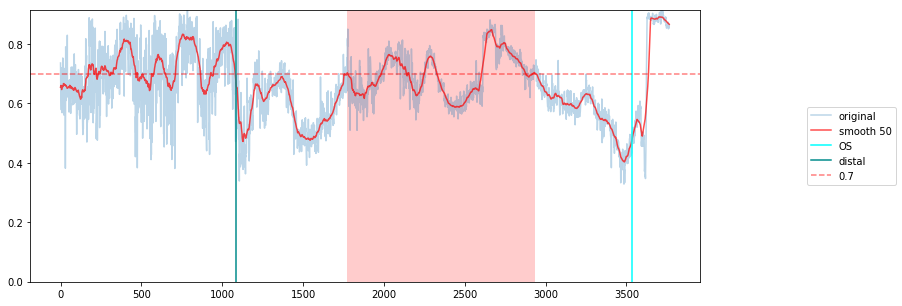

37
-1


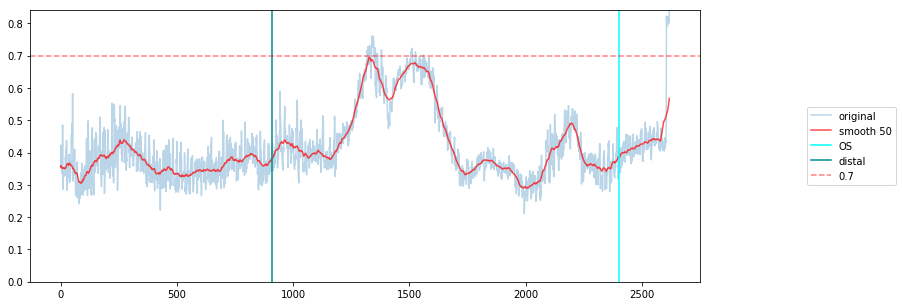

38
[]


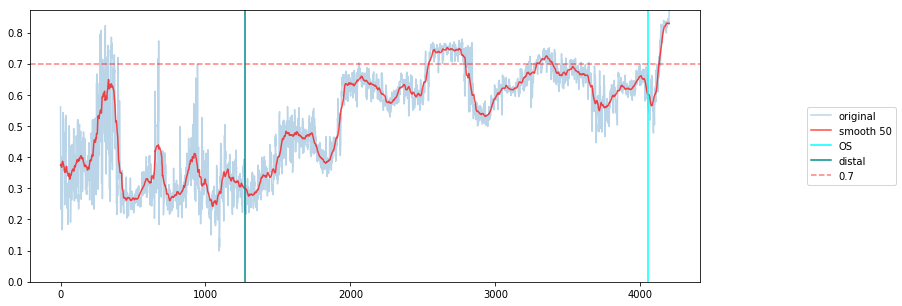

39
[array([1759, 2088])]


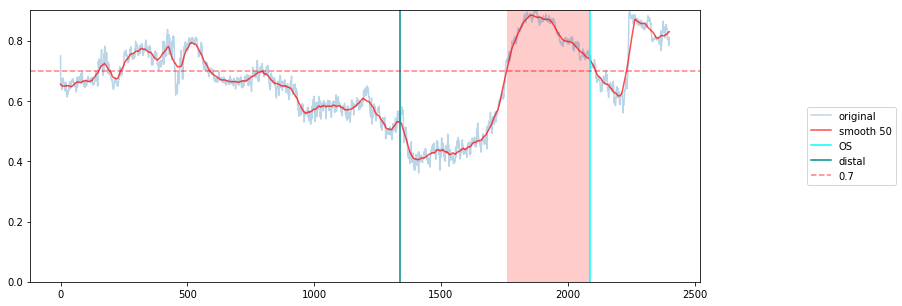

40
[]


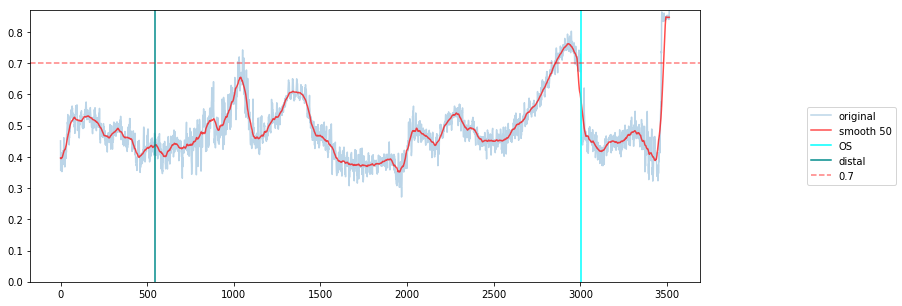

41
[array([1352, 2171])]


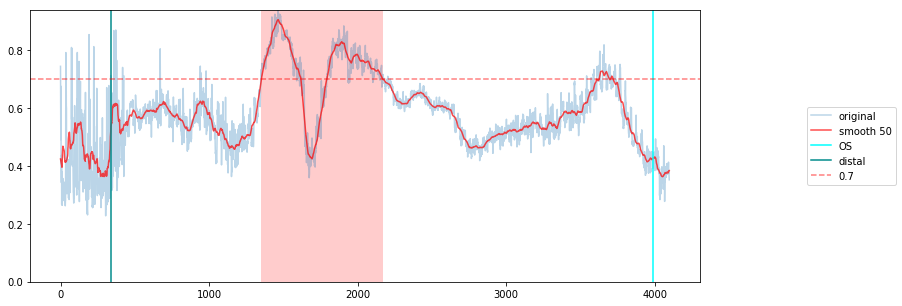

In [9]:
for i in df50.index:
    print(i)
    convolvevis(i,0.7,300)

In [12]:
import importlib
import feature_utils
importlib.reload(feature_utils)
from feature_utils import *

0
[array([ 883, 2152])]


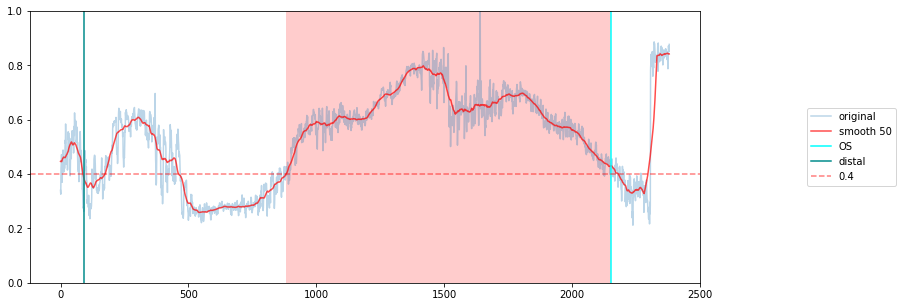

1
[array([ 551, 3097])]


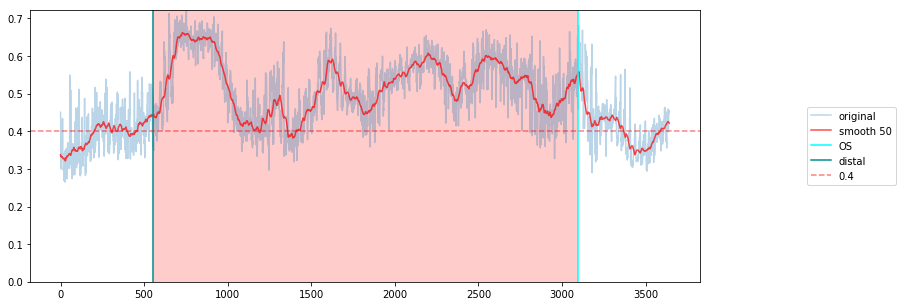

2
[array([ 261, 3463])]


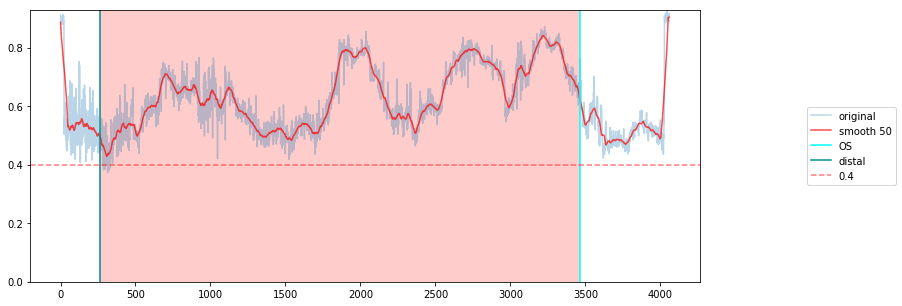

3
[array([ 285, 3883])]


/Users/paulnguyen/Desktop/Regis/Practicum2/bloodpressure_ffr/feature_utils.py:99: RuntimeWarning: invalid value encountered in true_divide
  return y/(x + y)


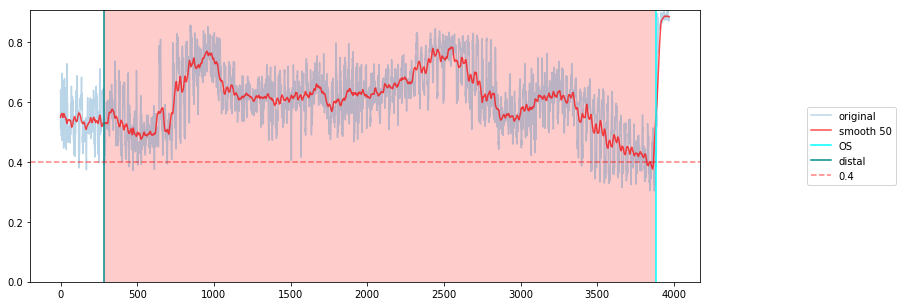

4
[array([ 516, 2083])]


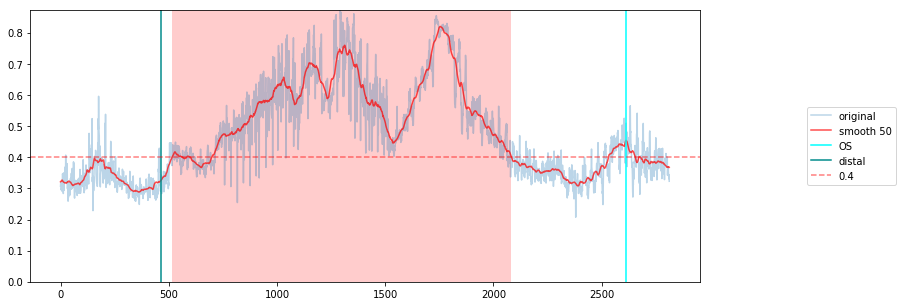

5
[array([ 116, 2569])]


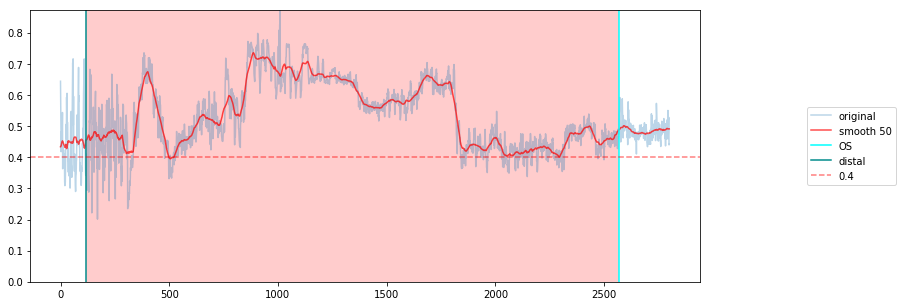

6
[array([ 62, 897])]


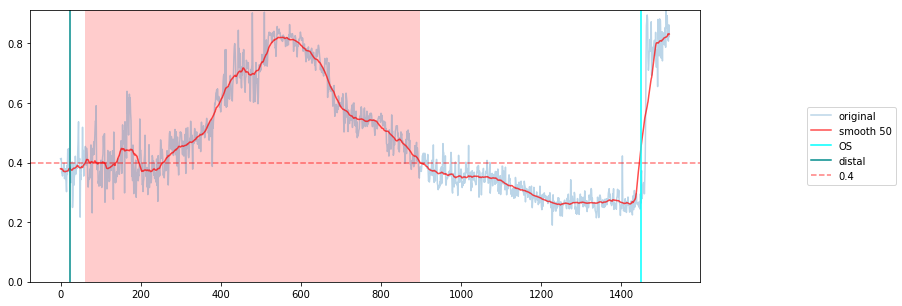

7
[array([ 170, 3019])]


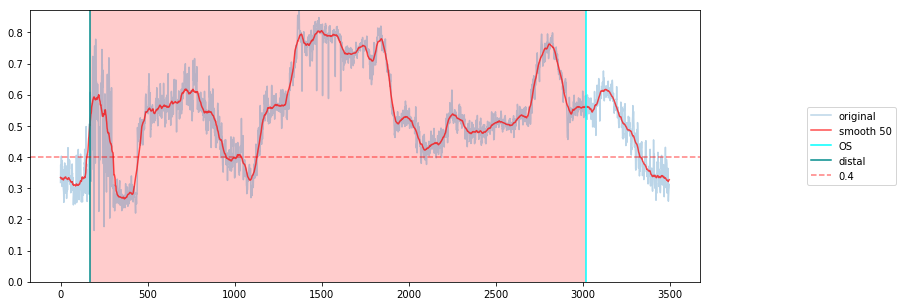

8
[array([  98, 1899])]


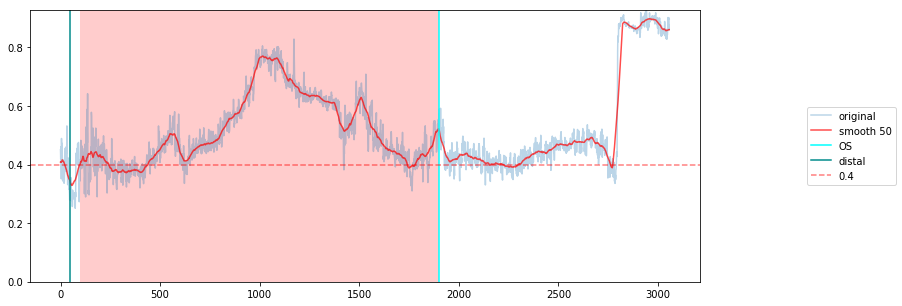

9
[array([ 320, 2343])]


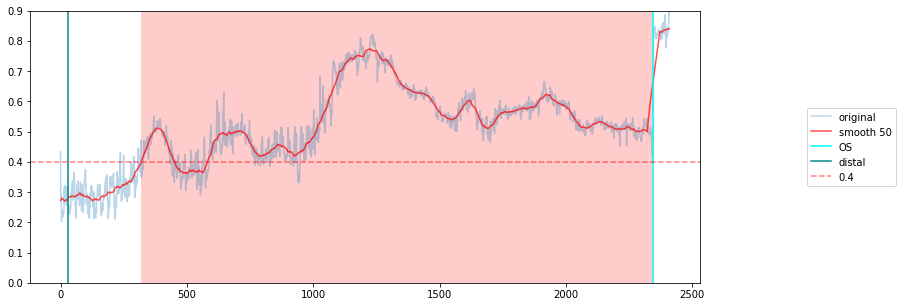

10
[array([ 104, 3606])]


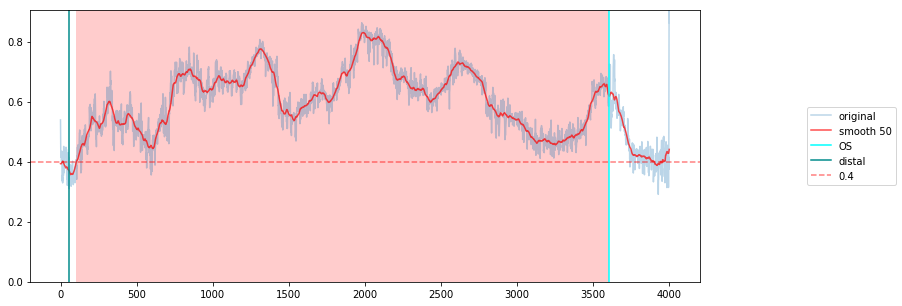

11
[array([ 668, 3549])]


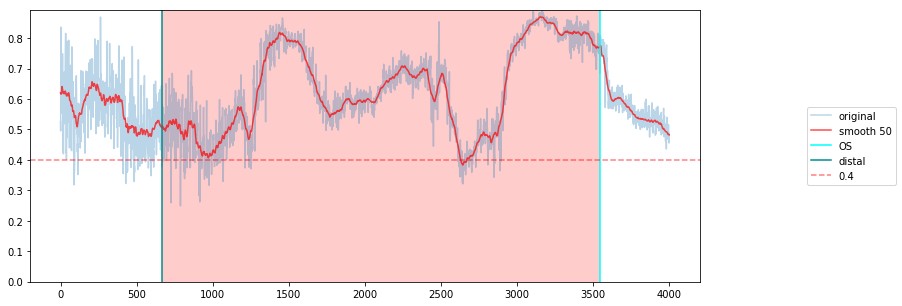

12
[array([1035, 2637])]


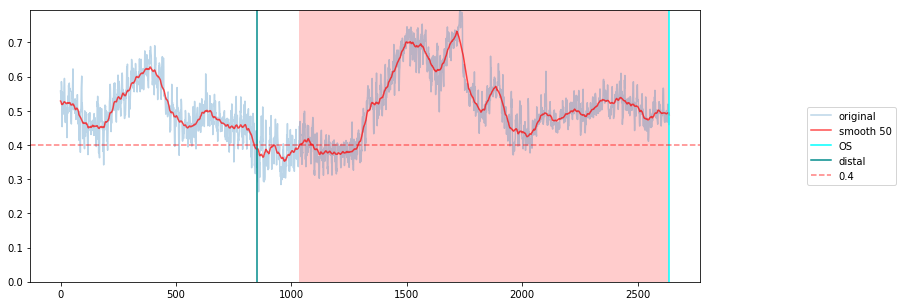

13
[array([242, 965])]


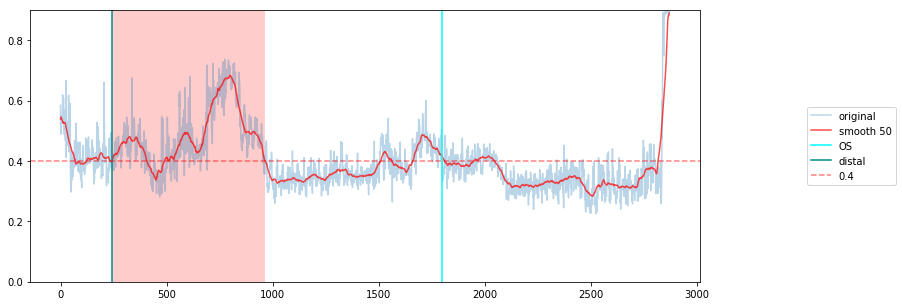

14
[array([ 319, 1944])]


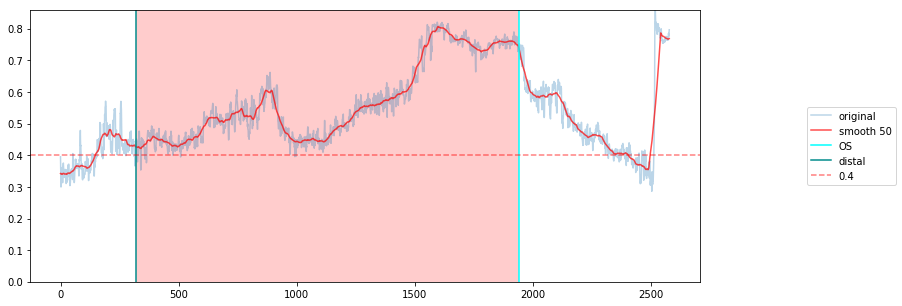

15
[array([ 653, 1437]), array([2781, 5432])]


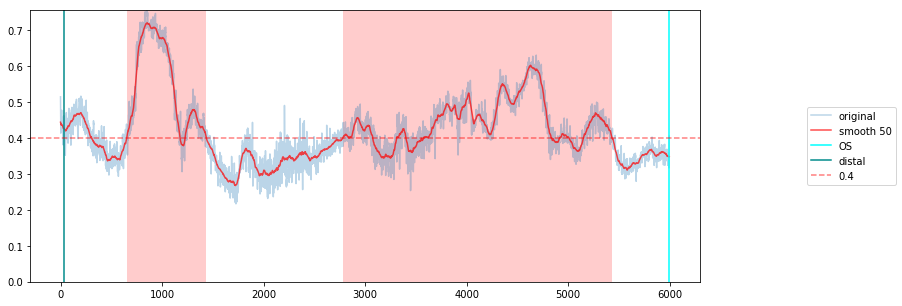

16
[array([ 274, 2291])]


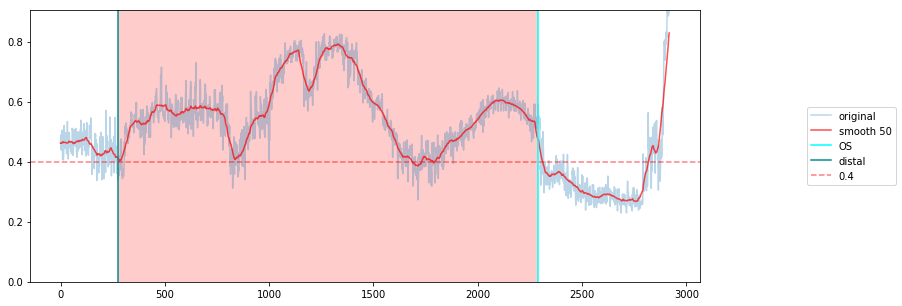

17
[array([304, 909])]


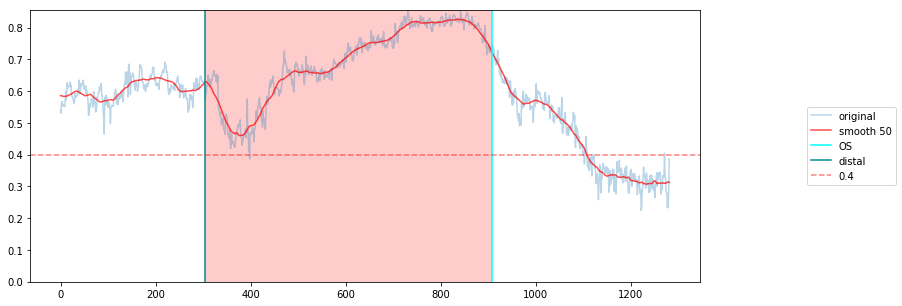

18
[array([  13, 1274])]


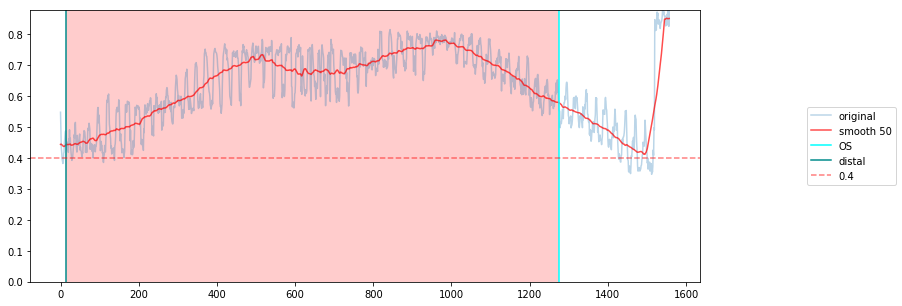

19
[array([ 114, 2369])]


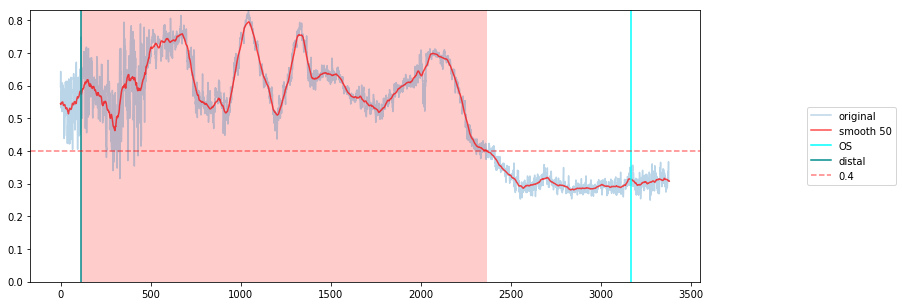

20
[array([ 479, 2919])]


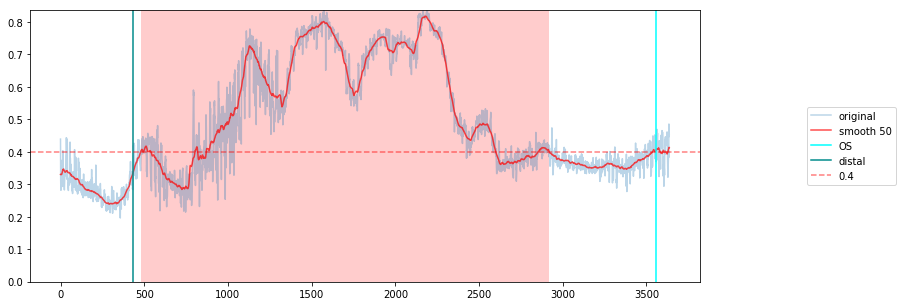

21
[array([1081, 3636]), array([4026, 4339])]


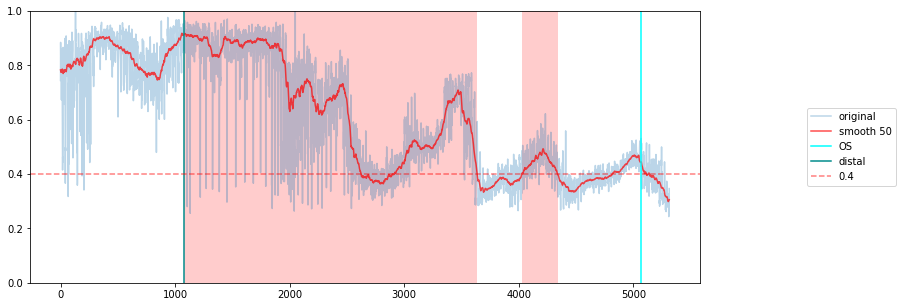

22
[array([1035, 1861])]


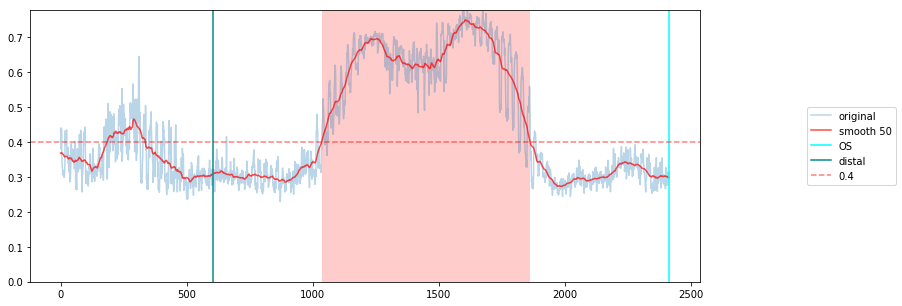

23
[array([ 199, 2170])]


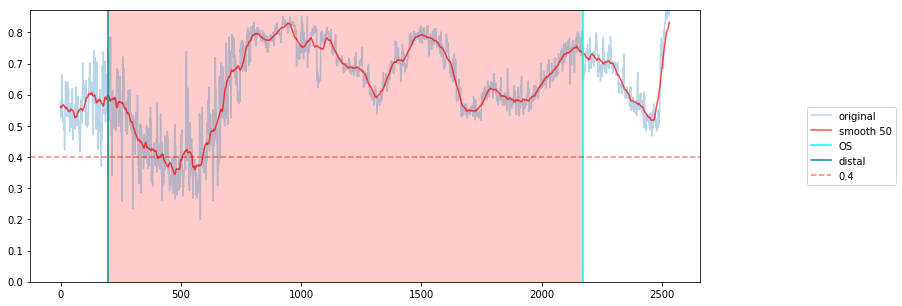

24
[array([  48, 4512])]


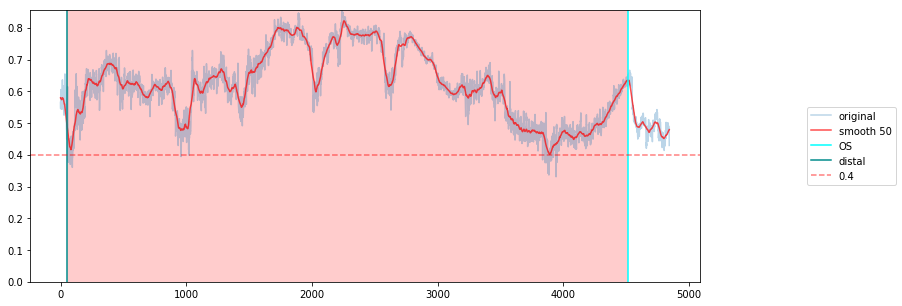

25
[array([ 421, 3825])]


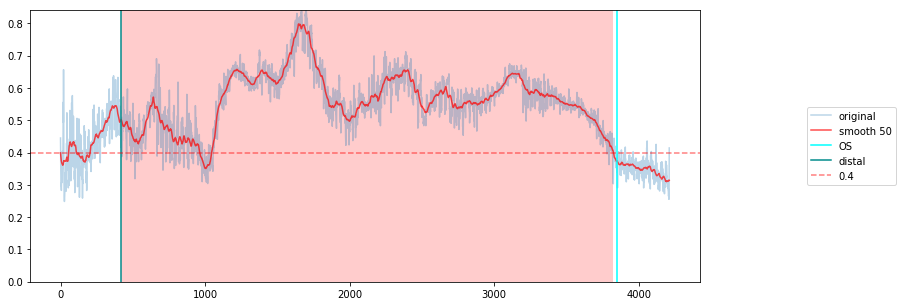

26
[array([1474, 3336]), array([3850, 4641])]


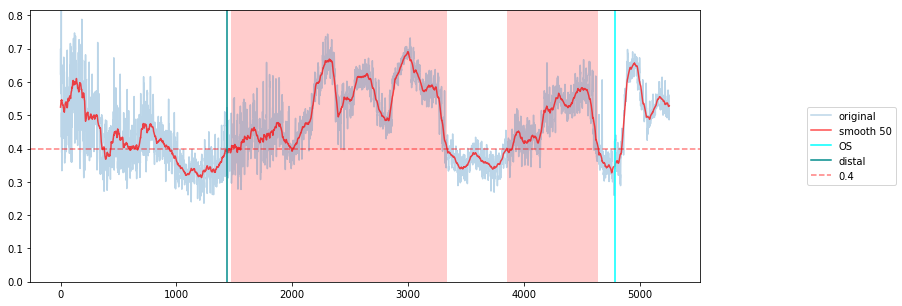

27
[array([ 117, 2630])]


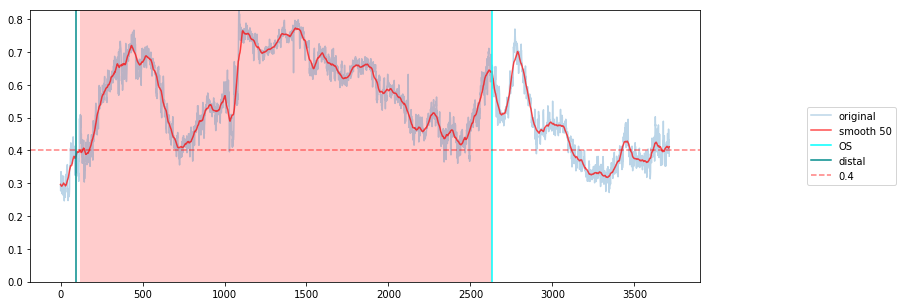

28
[array([ 426, 3802])]


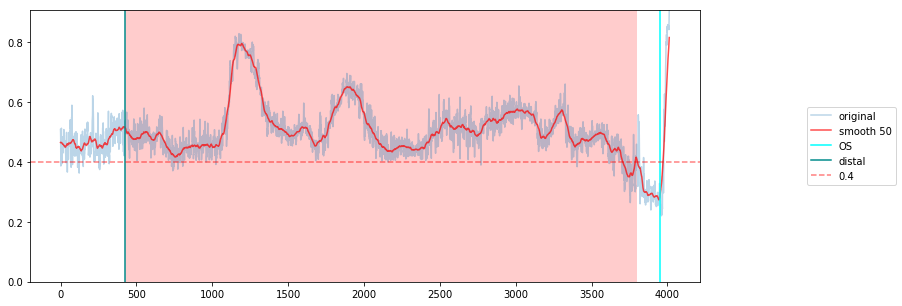

29
[array([1045, 2783]), array([3111, 3949])]


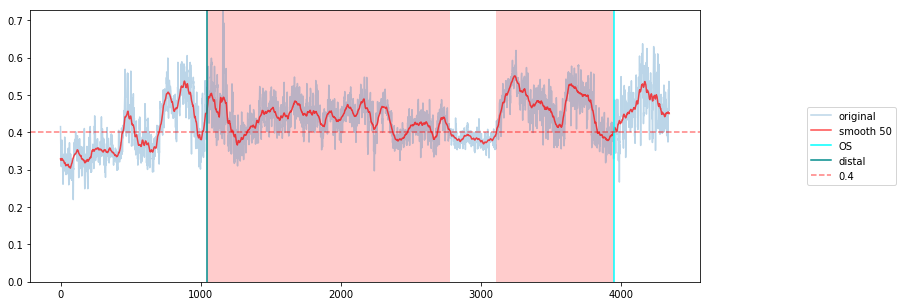

30
[array([ 221, 3122])]


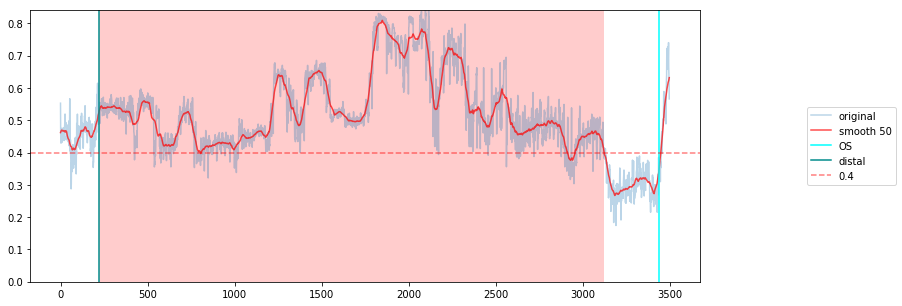

31
[array([ 446, 3392])]


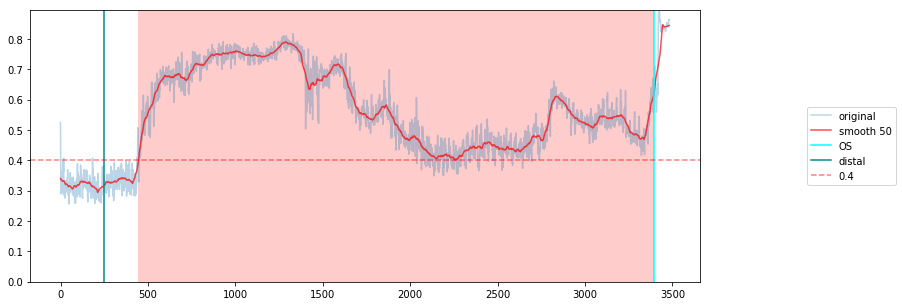

33
[array([  10, 3967])]


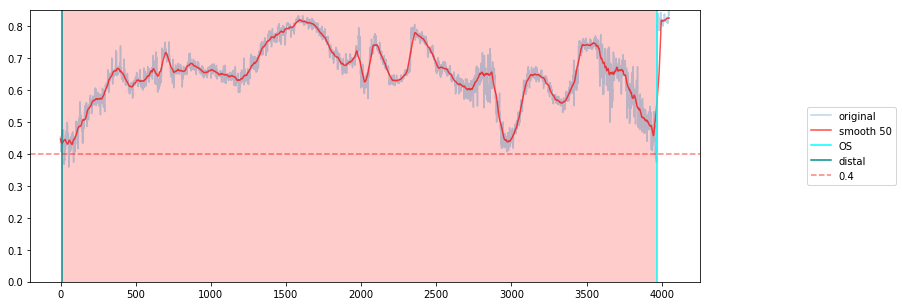

34
[array([ 533, 3200])]


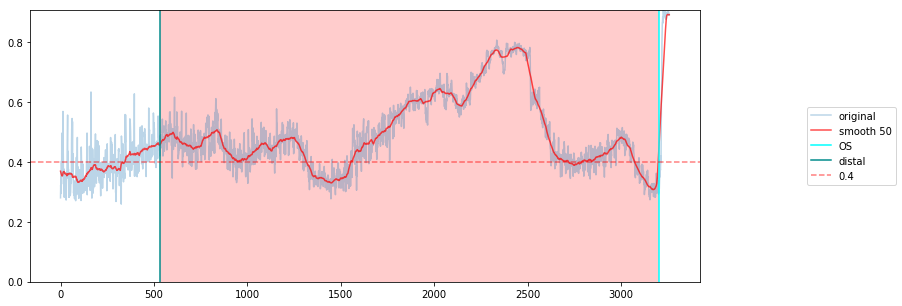

35
[array([1432, 3756])]


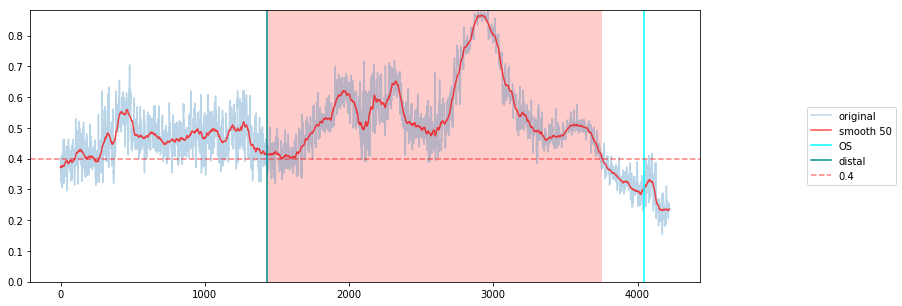

36
[array([1088, 3533])]


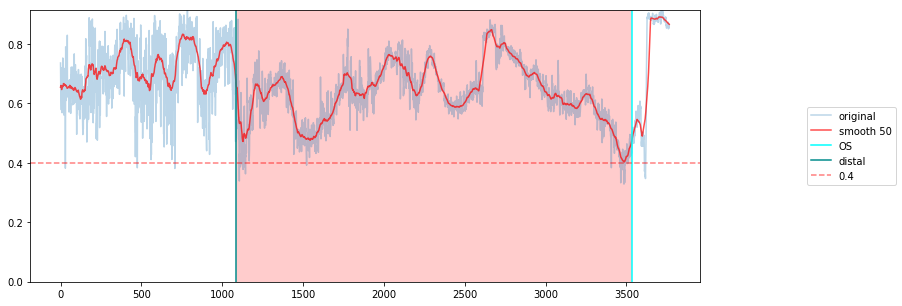

37
[array([ 922, 1691])]


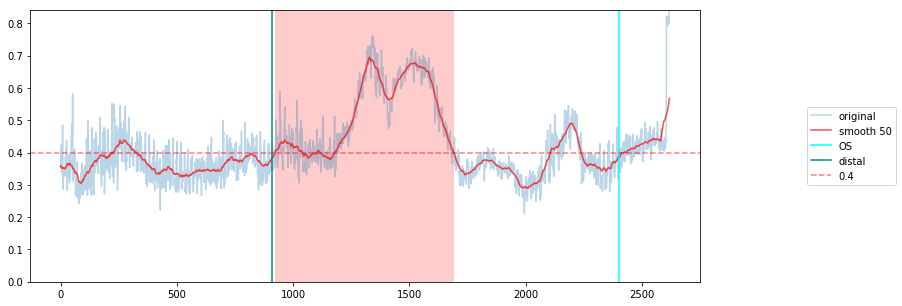

38
[array([1501, 4055])]


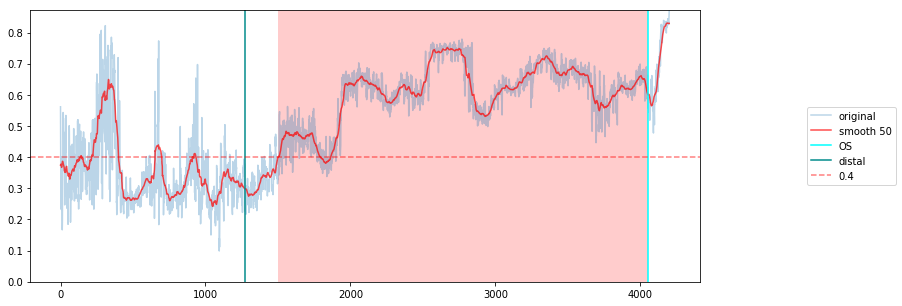

39
[array([1340, 2088])]


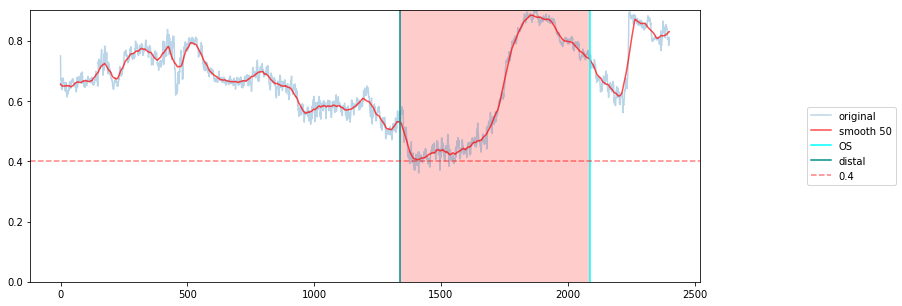

40
[array([ 546, 1588]), array([1992, 3001])]


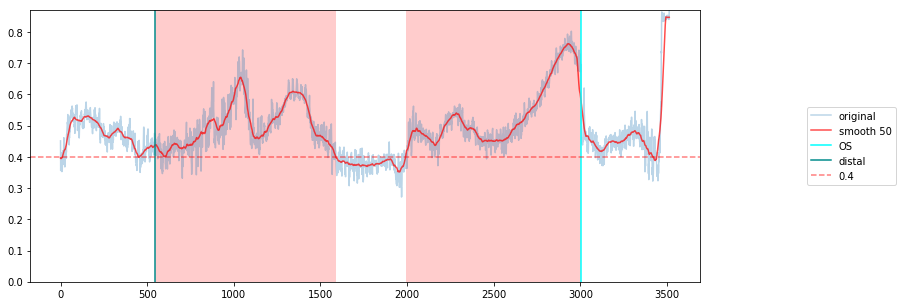

41
[array([ 343, 3991])]


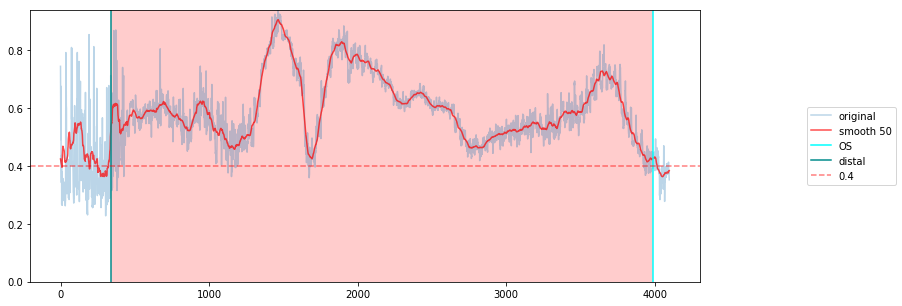

In [10]:
for i in df50.index:
    print(i)
    convolvevis(i,0.4,300)

## Savitzky-Golay Filter

In [32]:
t0 = time.time()
df50['luAs'] = df50['luA'].apply(lambda x: savgol_filter(x, 51, 3, mode='mirror'))
df50['plAs'] = df50['plA'].apply(lambda x: savgol_filter(x, 51, 3, mode='mirror'))
t1 = time.time()

total = t1-t0
print('Execution time: ',total,"secs")

Execution time:  0.0841820240020752 secs


In [49]:
def savitzkyvis(i, th, gap, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    # raw data
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    # smoothed data
    pb2 = plaqueburden(df50.loc[i].luAs, df50.loc[i].plAs)
    lesionindex2 = lesion(df50.loc[i].luAs, df50.loc[i].plAs,df50.loc[i].distal,df50.loc[i].OS,th,gap)
    print(lesionindex2)
    plt.figure(figsize=(12,5));
    plt.plot(pb,alpha=0.3,label='original')
    plt.plot(pb2, color='red',alpha=0.7)
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='cyan', label='OS')
    plt.axvline(ki, color='darkcyan',label='distal')
    plt.axhline(th, color='red',label=th)
    
    if(lesionindex2 != -1):
        for l in range(0,len(lesionindex2)):
            start = lesionindex2[l][0]
            end = lesionindex2[l][1]
            plt.axvspan(start, end, facecolor='r', alpha=0.2)
        
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    plt.show()


0
[[1314, 1807]]


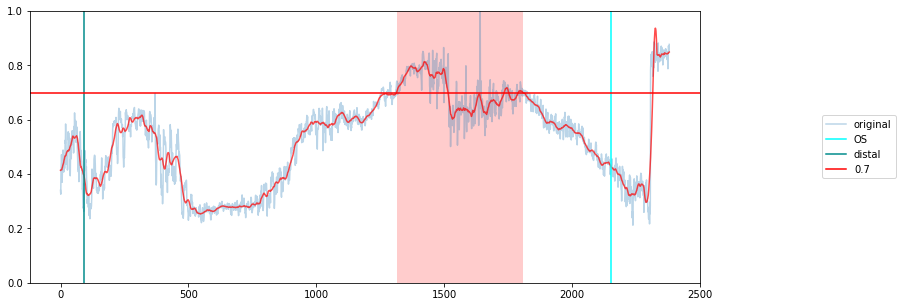

1
-1


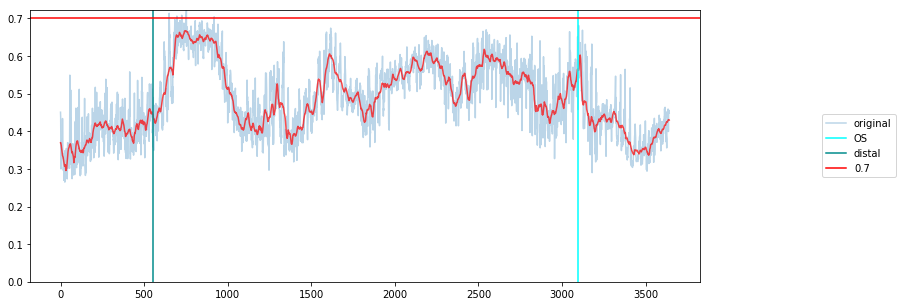

2
[[676, 729], [1846, 2114], [2574, 3422]]


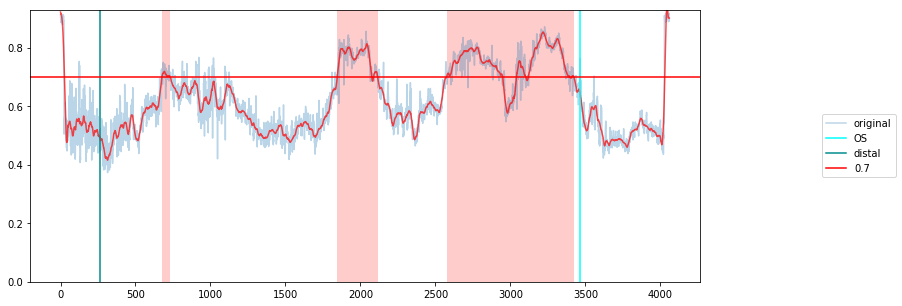

3
[[829, 1039], [2230, 2719]]


/Users/paulnguyen/Desktop/Regis/Practicum2/bloodpressure_ffr/feature_utils.py:99: RuntimeWarning: invalid value encountered in true_divide
  return y/(x + y)


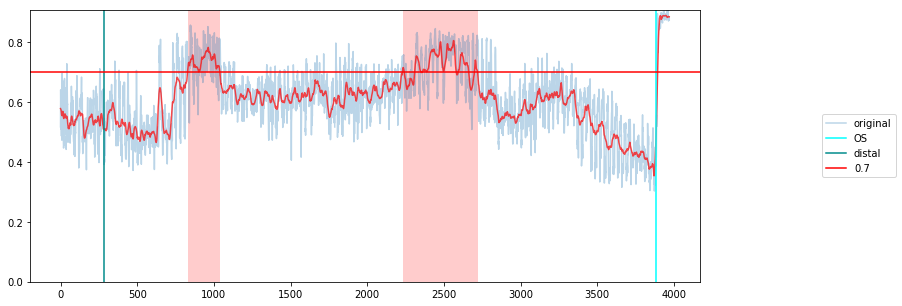

4
[[1152, 1365], [1702, 1816]]


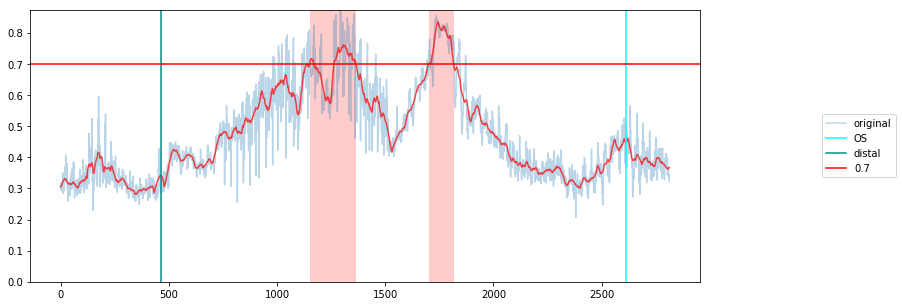

5
[[862, 1139]]


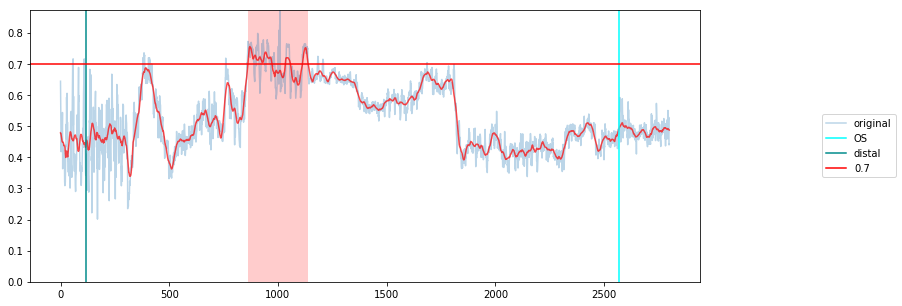

6
[[436, 663]]


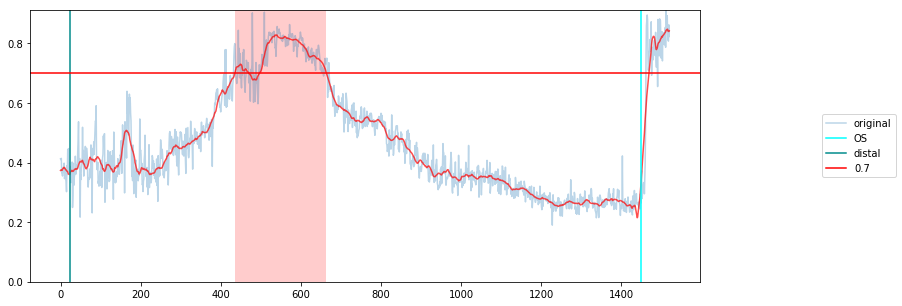

7
[[1347, 1877], [2746, 2855]]


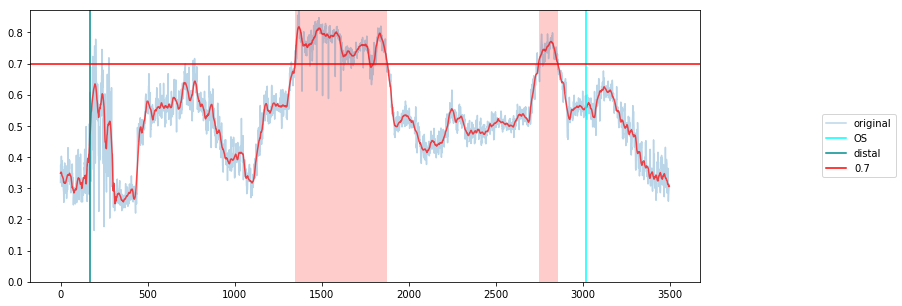

8
[[971, 1126]]


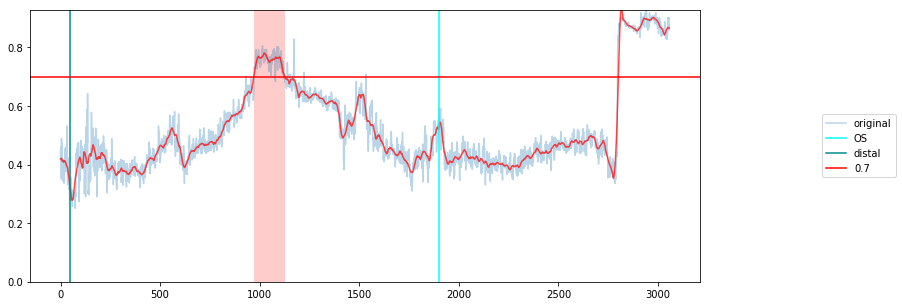

9
[[1114, 1321]]


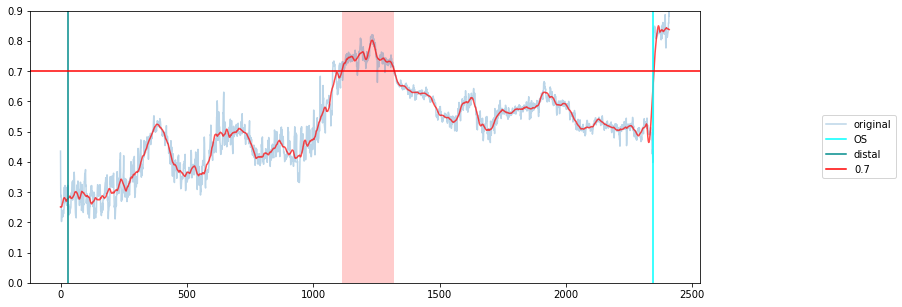

10
[[785, 864], [1234, 1387], [1848, 2187], [2573, 2710]]


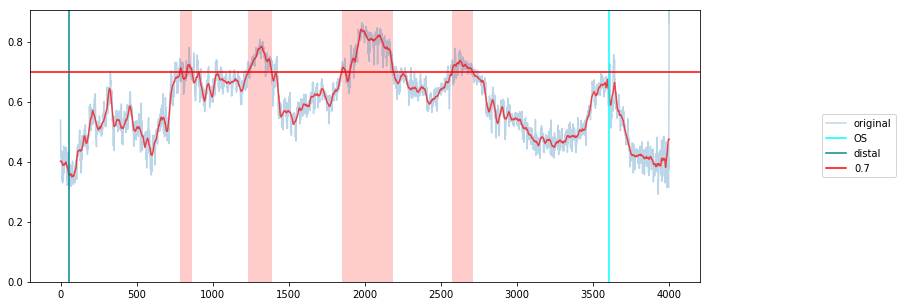

11
[[1340, 1648], [2236, 2419], [2942, 3549]]


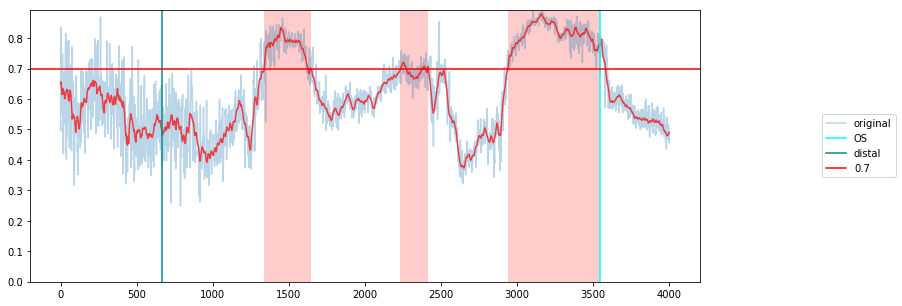

12
[[1490, 1740]]


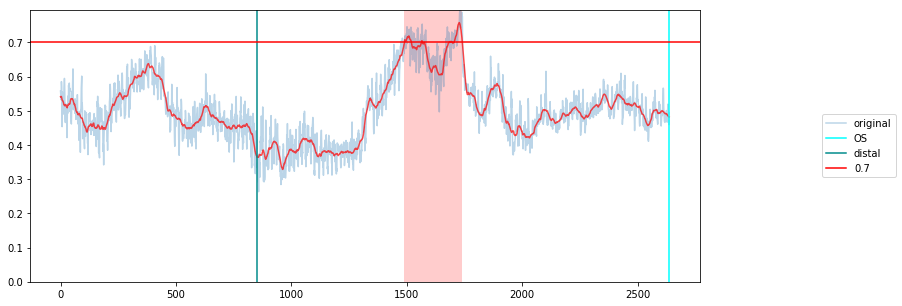

13
-1


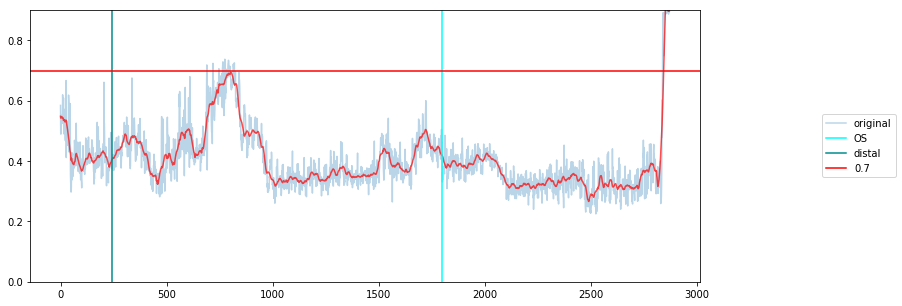

14
[[1516, 1944]]


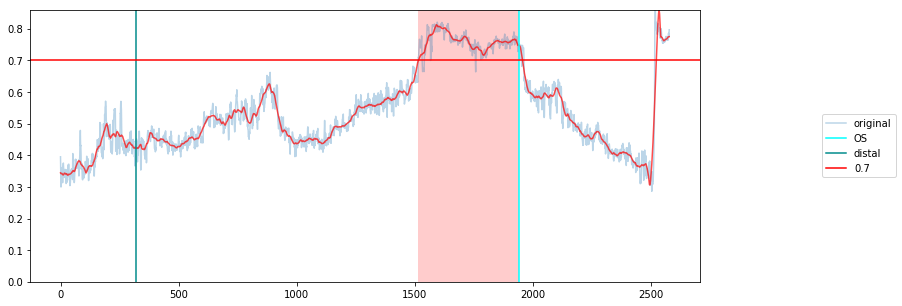

15
[[815, 949]]


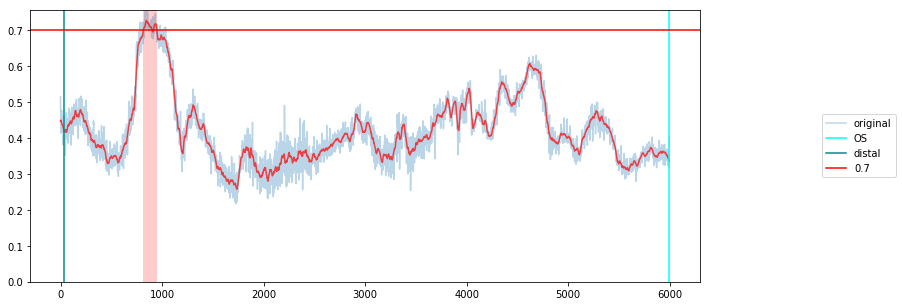

16
[[1036, 1428]]


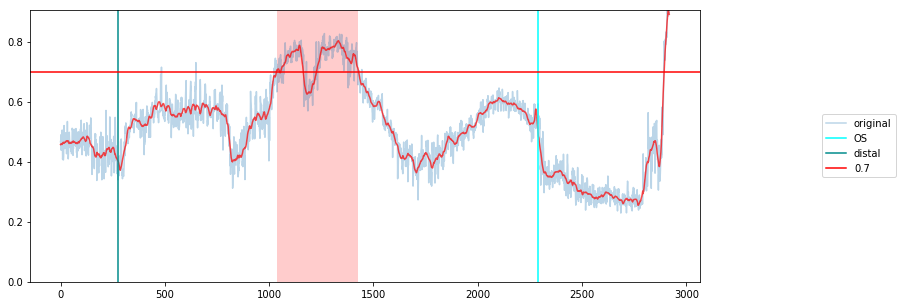

17
[[595, 909]]


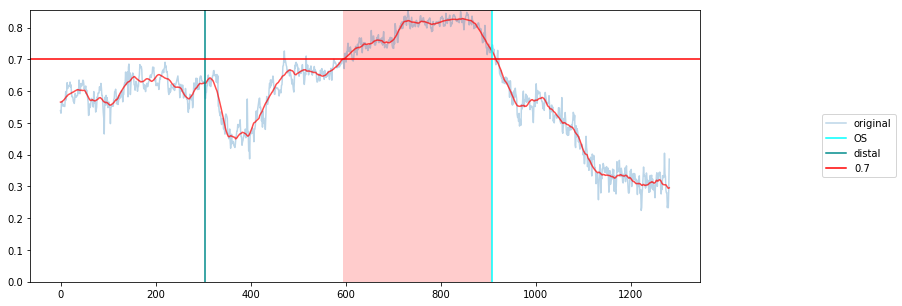

18
[[431, 1113]]


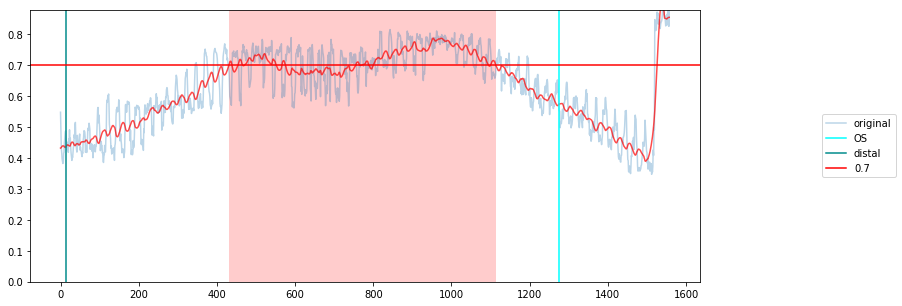

19
[[491, 1365], [2073, 2088]]


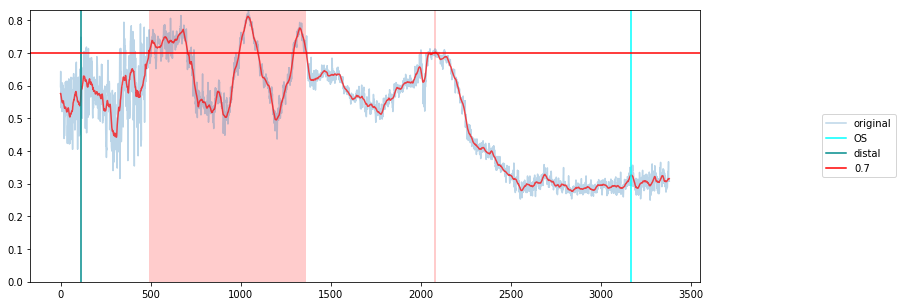

20
[[1113, 2290]]


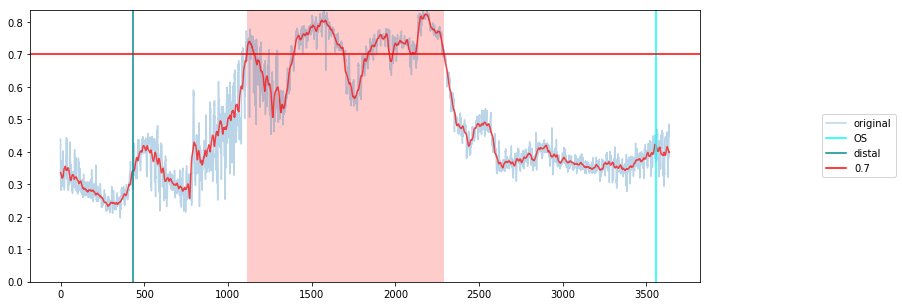

21
[[1081, 2495], [3459, 3503]]


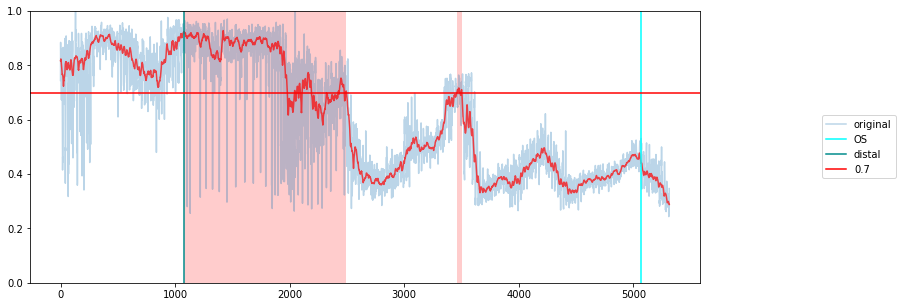

22
[[1545, 1698]]


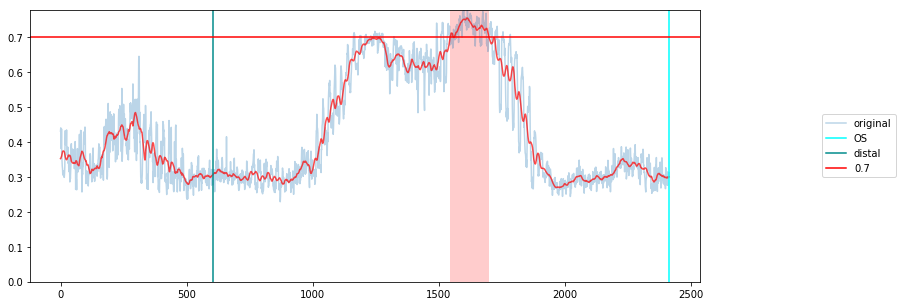

23
[[705, 1624], [2069, 2170]]


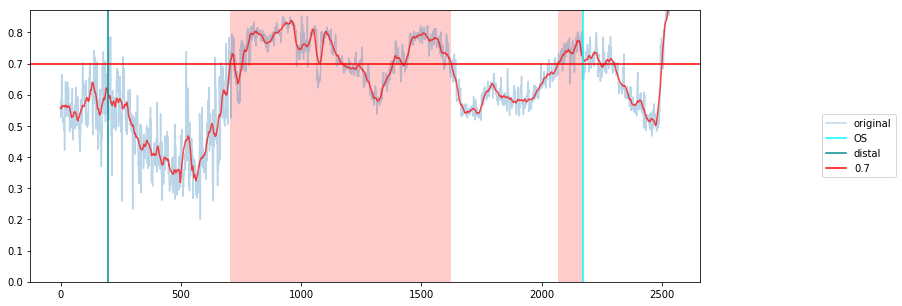

24
[[1599, 2952]]


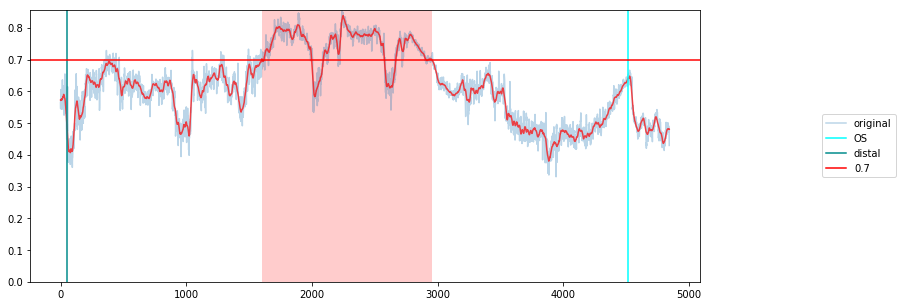

25
[[1589, 1750]]


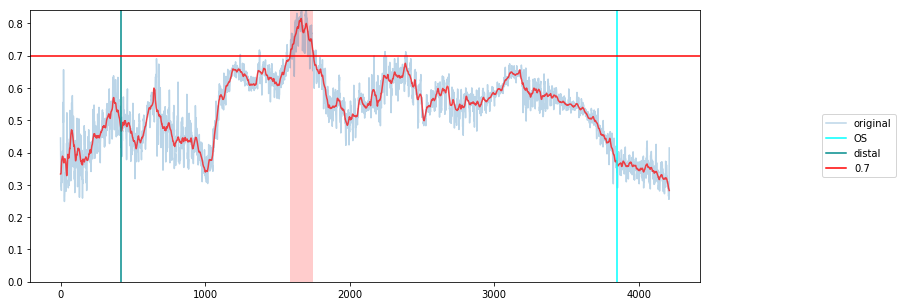

26
[[3005, 3009]]


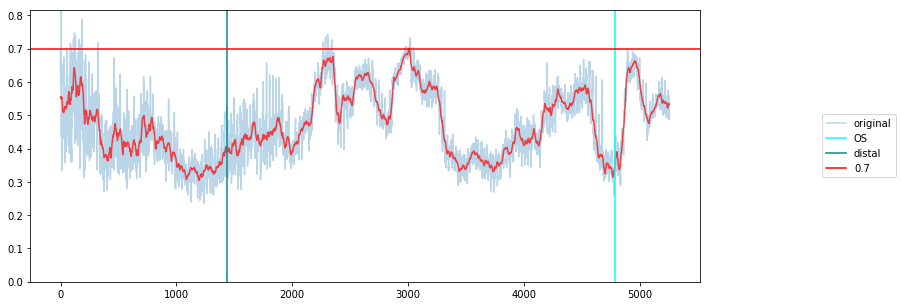

27
[[417, 454], [1088, 1593]]


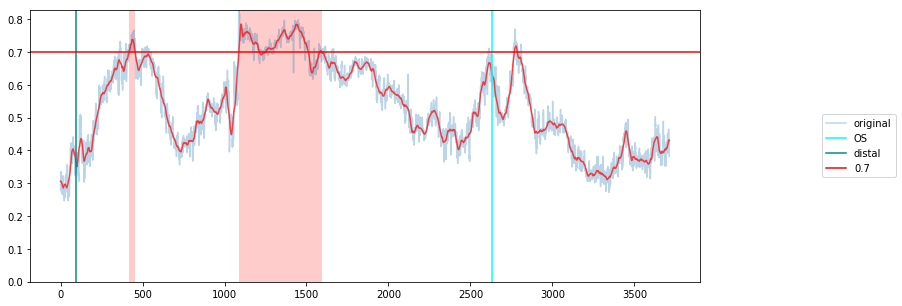

28
[[1129, 1283]]


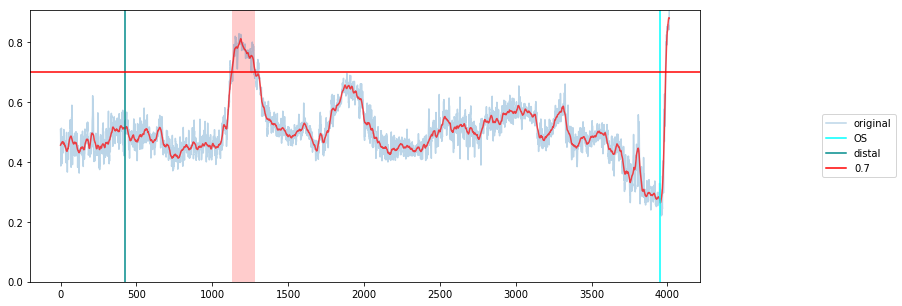

29
-1


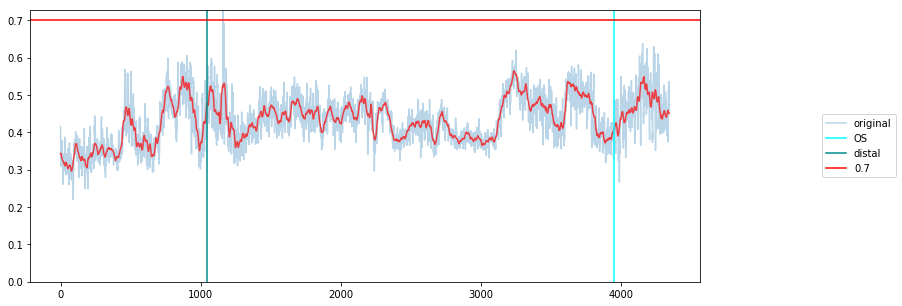

30
[[1793, 2306]]


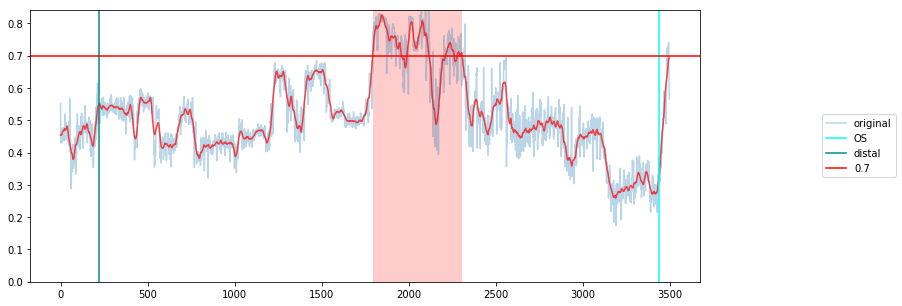

31
[[754, 1623]]


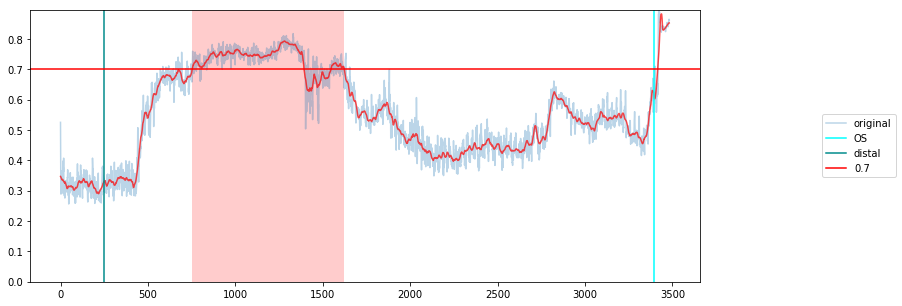

33
[[679, 719], [1319, 2485], [3447, 3596]]


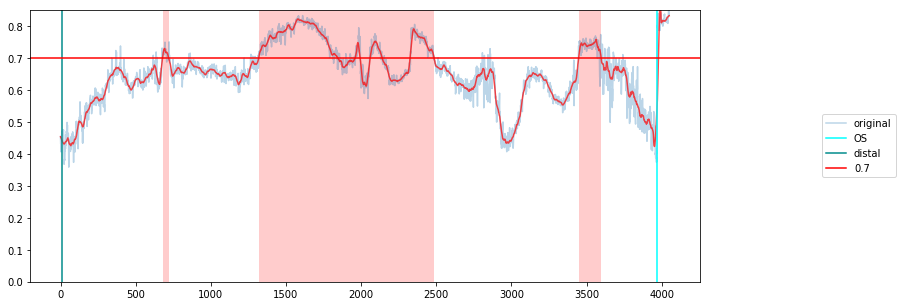

34
[[2259, 2511]]


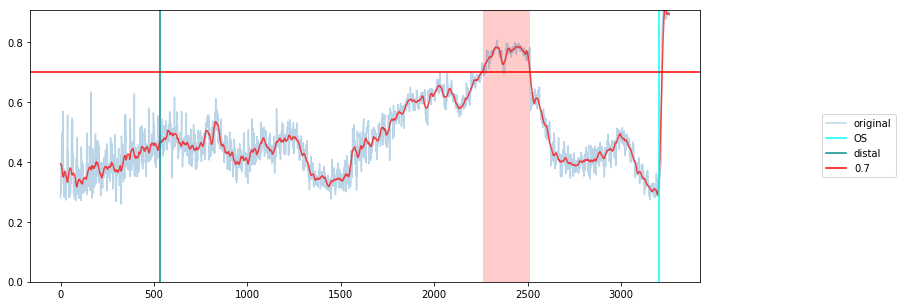

35
[[2781, 3053]]


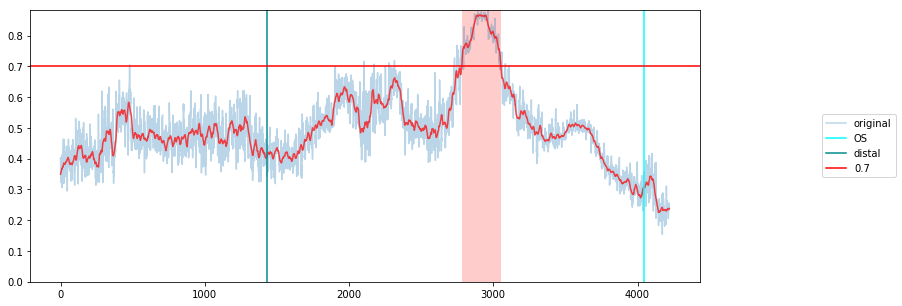

36
[[1209, 1216], [1759, 2947]]


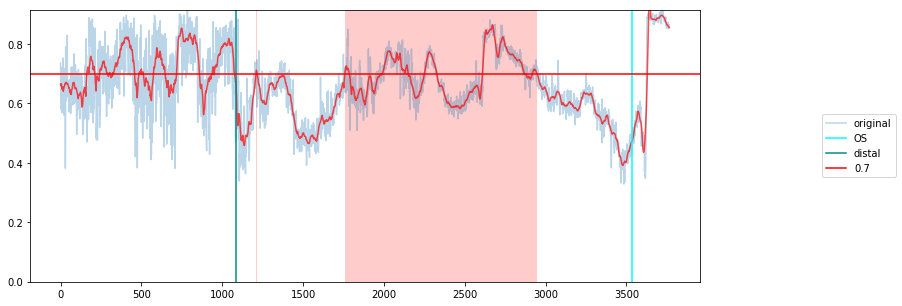

37
[[1325, 1342]]


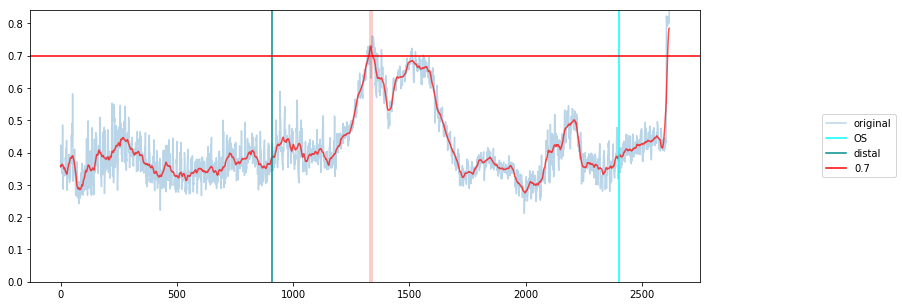

38
[[2547, 2801], [3286, 3385]]


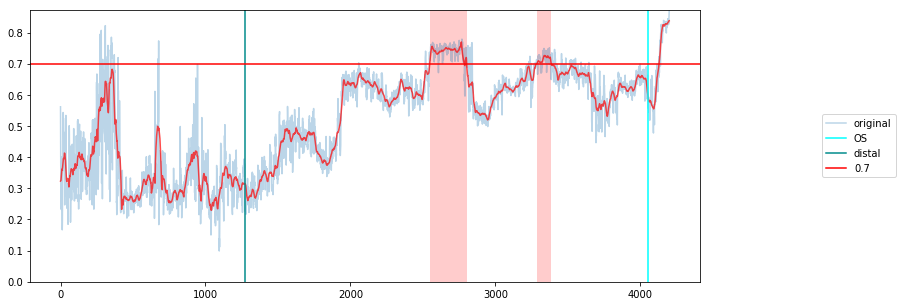

39
[[1758, 2088]]


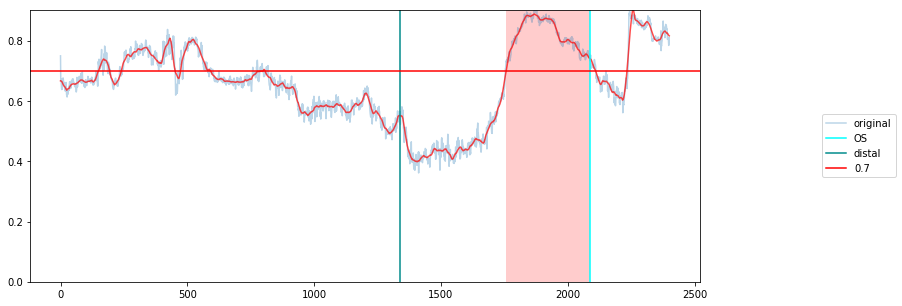

40
[[2856, 2992]]


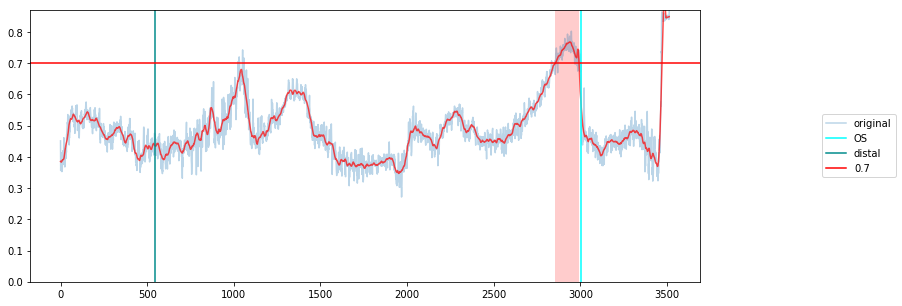

41
[[1350, 2172], [3614, 3735]]


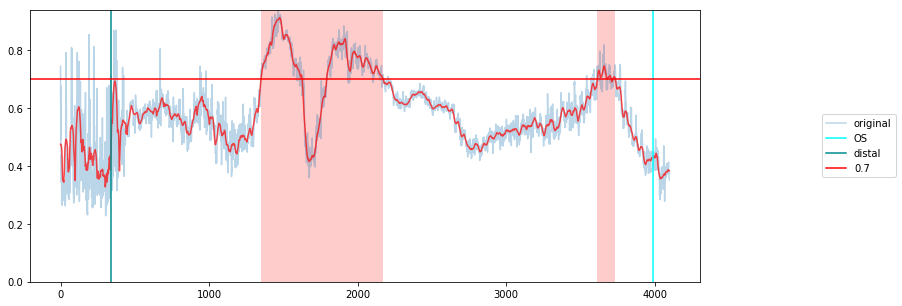

In [50]:
for i in df50.index:
    print(i)
    savitzkyvis(i,0.7,300)

## Convolution compare smoothing windows 15, 50, 100

In [131]:
def vis4(i, th,smooth,gap, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    # raw data
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    #lesionindex = lesion(df50.loc[i].luA, df50.loc[i].plA,th,gap)
    plt.figure(figsize=(12,5));
    plt.plot(pb,alpha=0.3,label='original')
    
    # smoothed data
    for s in smooth:
        luAs = np.convolve(df50.loc[i].luA,np.ones((s,))/s,mode='same')
        plAs = np.convolve(df50.loc[i].plA,np.ones((s,))/s,mode='same')
        pb2 = plaqueburden(luAs, plAs)
        #lesionindex2 = lesion(luAs, plAs,th,gap)
        label = 'smooth ' + str(s)
        plt.plot(pb2,alpha=0.7,label=label)
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='cyan', label='OS')
    plt.axvline(ki, color='darkcyan',label='distal')
    plt.axhline(th, linestyle='--', color='red',label=th,alpha=0.5)
    
    #for l in range(0,len(lesionindex2)):
    #    start = lesionindex2[l][0]
    #    end = lesionindex2[l][1]
    #    plt.axvspan(start, end, facecolor='r', alpha=0.2)
        
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    if show:
        plt.show()
    else:
        return plt

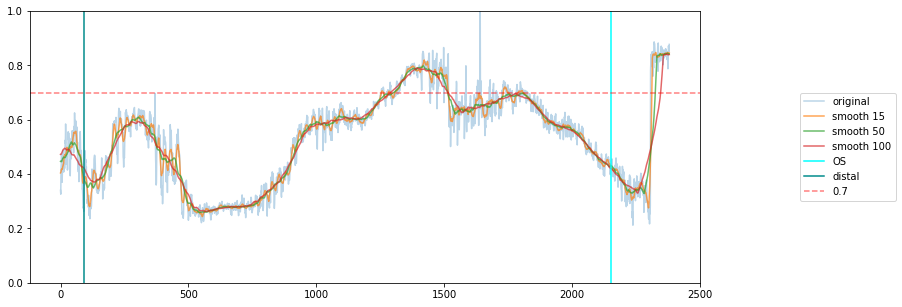

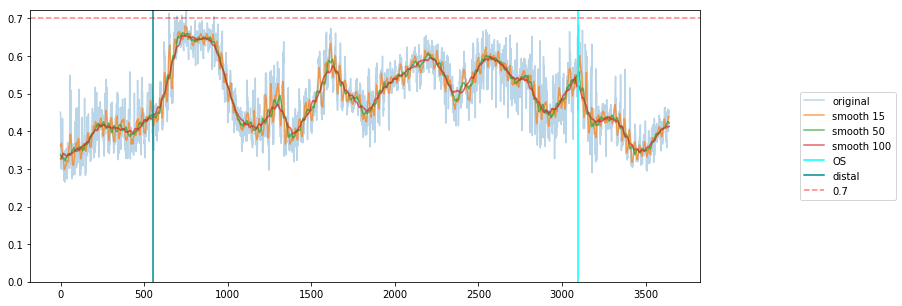

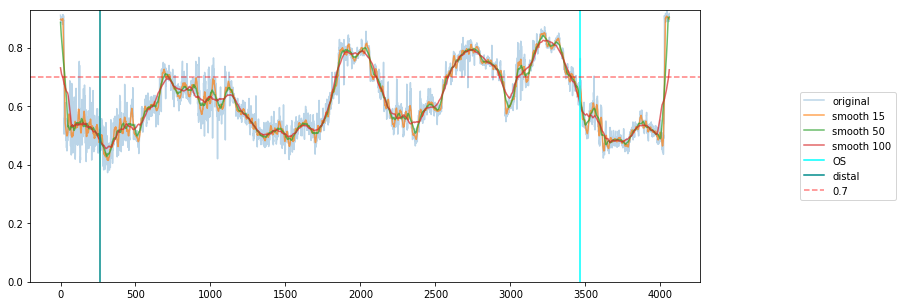

/Users/paulnguyen/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


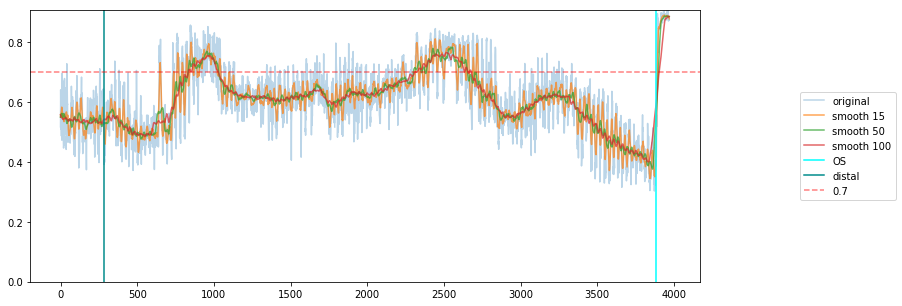

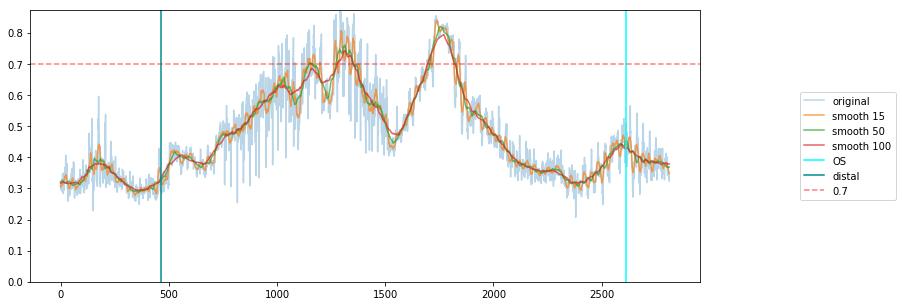

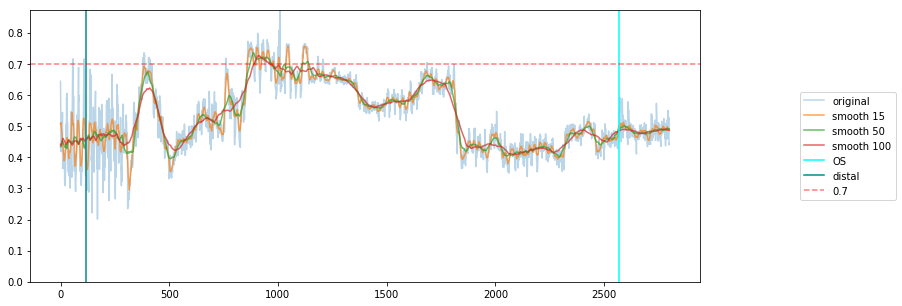

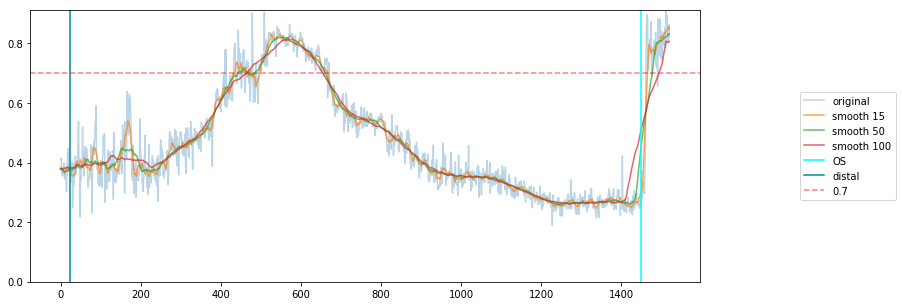

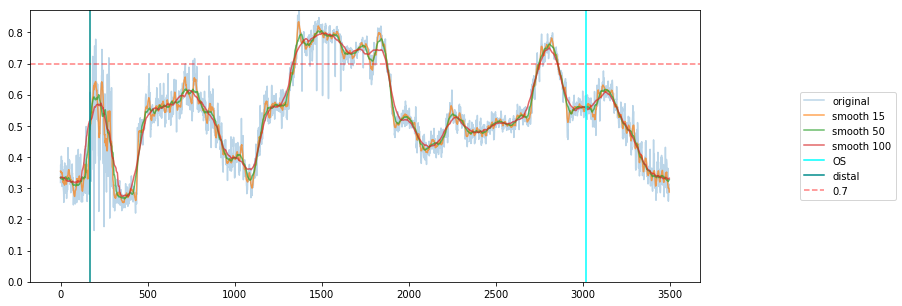

...

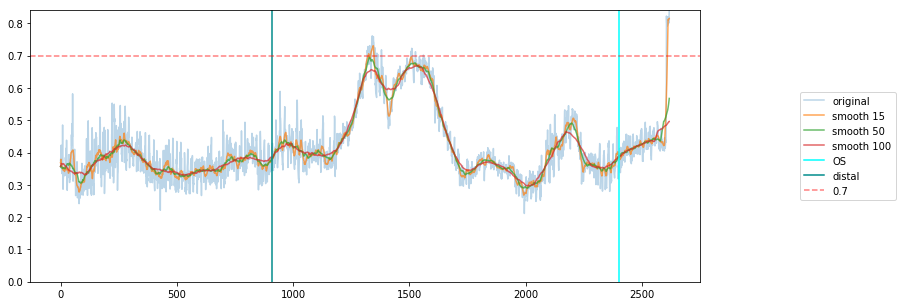

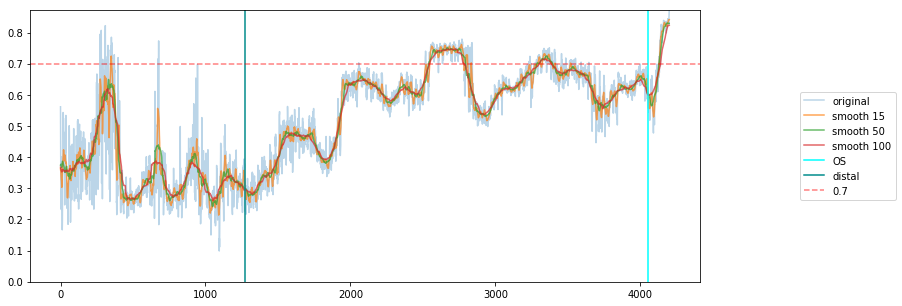

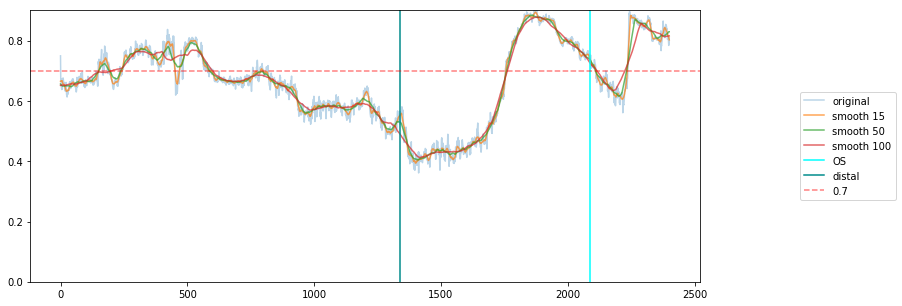

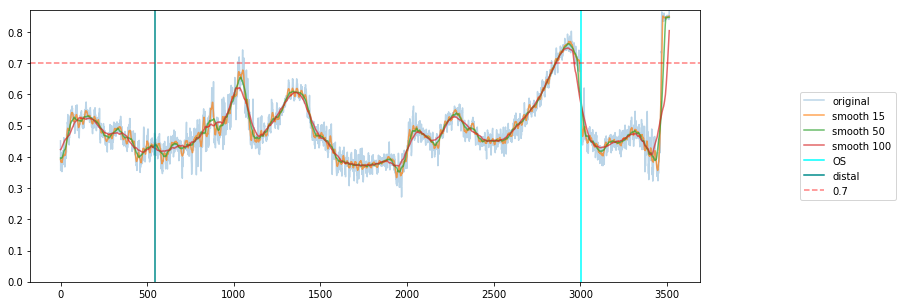

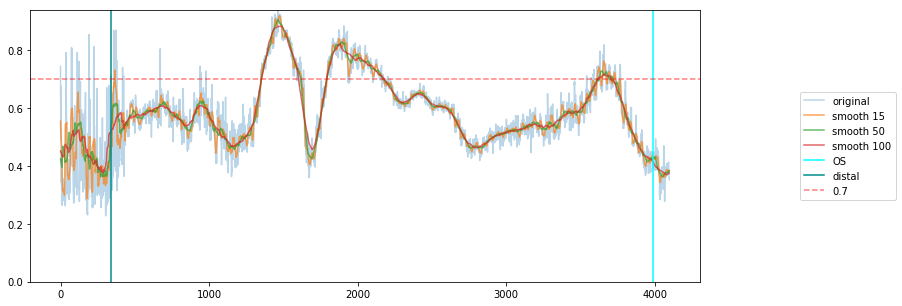

In [136]:
#vis4(1,0.7,[25,50,100],300)
for i in df50.index:
    vis4(i,0.7,[15,50,100],300)

## Savitzky-Golay Filter compare smoothing windows 15, 55, 105

In [154]:
def vis5(i, th,smooth,gap, show=True):
    """
    i: index
    th: plaqueburden threshold
    """
    # raw data
    pb = plaqueburden(df50.loc[i].luA, df50.loc[i].plA)
    #lesionindex = lesion(df50.loc[i].luA, df50.loc[i].plA,th,gap)
    plt.figure(figsize=(12,5));
    plt.plot(pb,alpha=0.3,label='original')
    
    # smoothed data
    for s in smooth:
        luAs = savgol_filter(df50.loc[i].luA, s, 3, mode='mirror')
        plAs = savgol_filter(df50.loc[i].plA, s, 3, mode='mirror')
        pb2 = plaqueburden(luAs, plAs)
        #lesionindex2 = lesion(luAs, plAs,th,gap)
        label = 'smooth ' + str(s)
        plt.plot(pb2,alpha=0.7,label=label)
    ymax = max(pb)
    plt.ylim(0,ymax)
    ki = df50['distal'].loc[i]
    kf = df50['OS'].loc[i]
    plt.axvline(kf, color='cyan', label='OS')
    plt.axvline(ki, color='darkcyan',label='distal')
    plt.axhline(th, linestyle='--', color='red',label=th,alpha=0.5)
    
    #for l in range(0,len(lesionindex2)):
    #    start = lesionindex2[l][0]
    #    end = lesionindex2[l][1]
    #    plt.axvspan(start, end, facecolor='r', alpha=0.2)
        
    plt.legend(loc="right",bbox_to_anchor=(1.3, 0.5));
    if show:
        plt.show()
    else:
        return plt

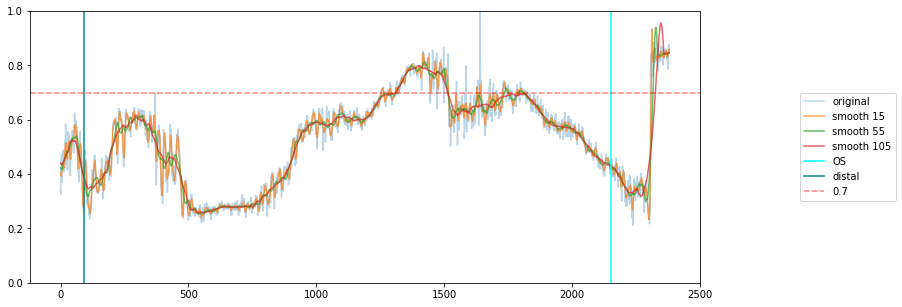

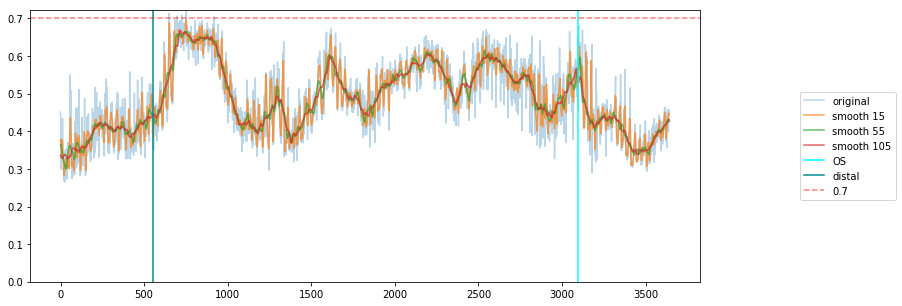

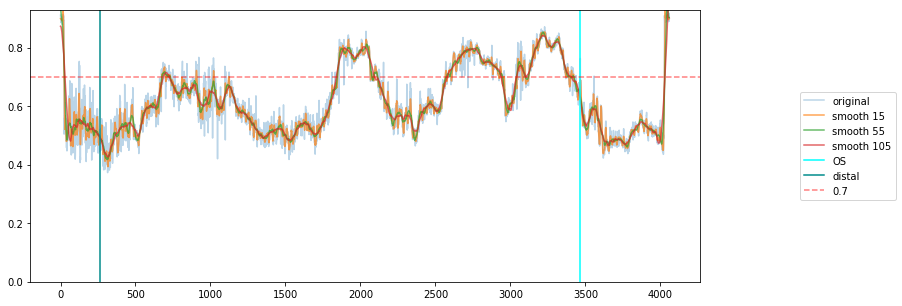

/Users/paulnguyen/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


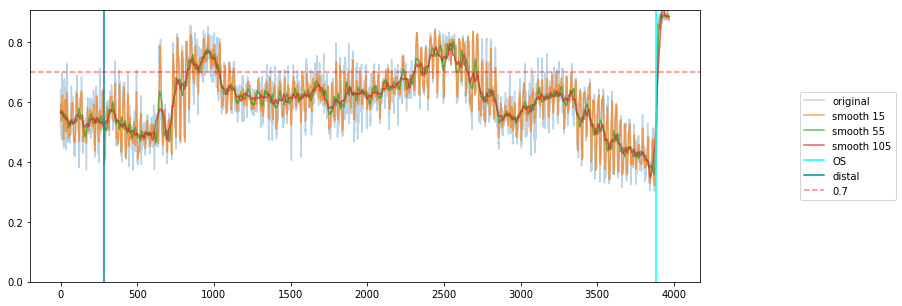

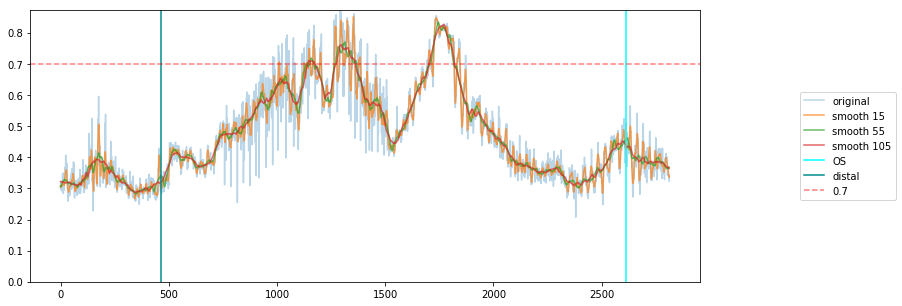

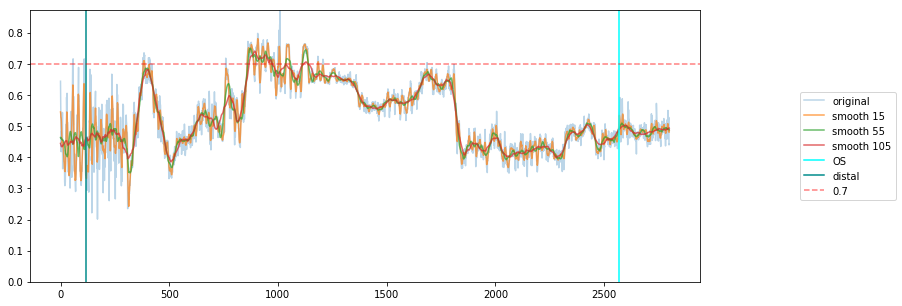

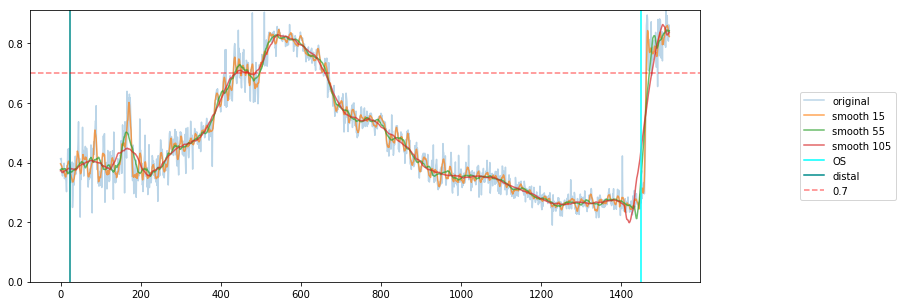

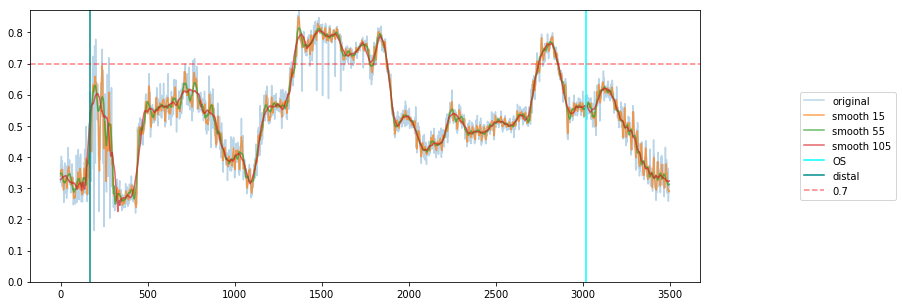

...

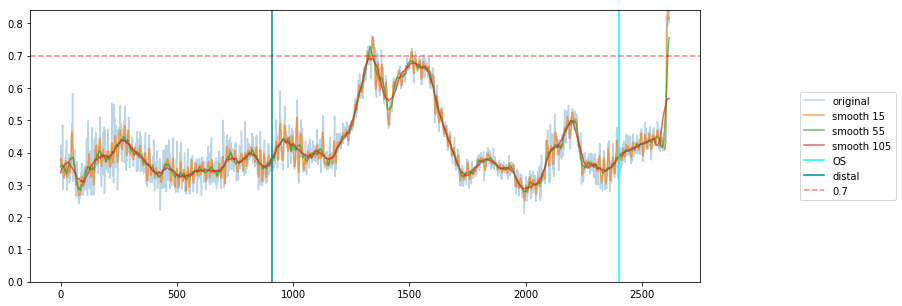

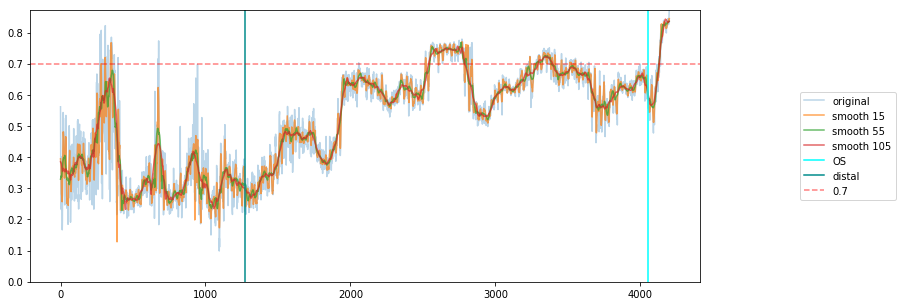

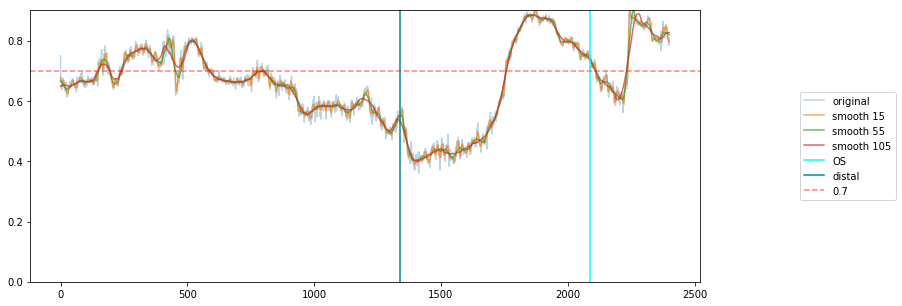

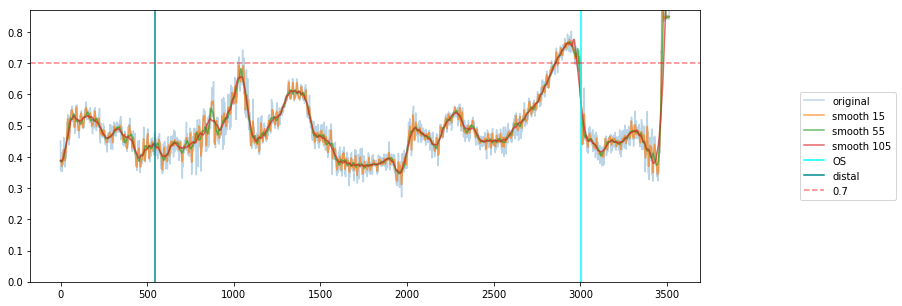

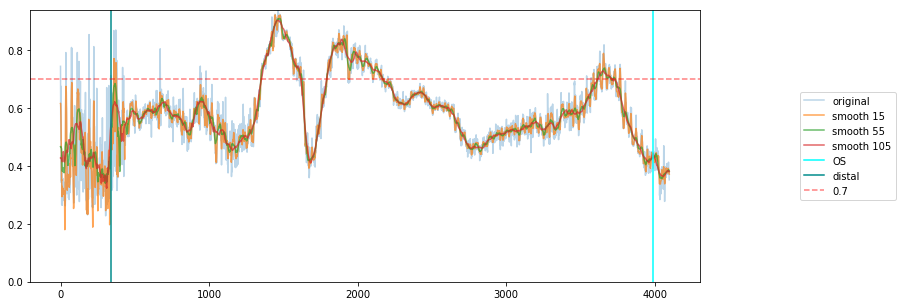

In [156]:
for i in df50.index:
    vis5(i,0.7,[15,55,105],300)

In [45]:
x = np.array(df50.loc[3].luAs)
y = np.array(df50.loc[3].plAs)

In [48]:
min((x + y))

8.1055981166049769